# **1. Setup e imports**

In [1]:
%run notebook_setup.py

# garante que todos os módulos importados sejam recarregados automaticamente antes de cada execução de célula.
%load_ext autoreload
# O número 2 significa: Recarregue automaticamente todos os módulos importados antes da execução de qualquer célula.
%autoreload 2

[INFO] src adicionado ao sys.path: /home/ilfn/datascience/workspace/projeto_analise_series_temporais/src


In [2]:
# !pip install "numpy>=1.22,<1.26" "scipy<1.16" "pmdarima==2.0.4"

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import statsmodels.tsa.api as smt

import pmdarima as pm
from pmdarima import utils
from pmdarima.pipeline import Pipeline

from pathlib import Path

import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore', np.RankWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=ConvergenceWarning)


# from backend.preprocessing import aplicar_log, diferenciar, reverter_transformacoes
from backend.stats_tests import teste_adf
from backend.preprocessing import split_series_treino_teste
from backend.visualization import (
    plot_acf_pacf, plot_annual_trend, 
    plot_full_time_series, plot_train_test_split
)

from backend.residuals import (
    calc_residuo_mm, plot_mm_e_residuo,
    calc_residuo_ewm, plot_ewm_e_residuo
)

from backend.arima_model import (
    rodar_modelo_arima
)



In [4]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 15, 6

# **2. Carregamento dos Dados**

Nesta etapa inicial, será realizado o carregamento do dataset a partir de um arquivo CSV.

O dataset contém informações sobre o índice **IPG2211A2N** [FRED – Federal Reserve Bank of St. Louis](https://fred.stlouisfed.org/series/IPG2211A2N) que representa a **Produção Industrial do setor de eletricidade e gás (Electric and Gas Utilities) nos Estados Unidos**.

Principais características do índice:
- É um índice de produção industrial, com ano-base em 2017 = 100.
- Mede a produção real das empresas de eletricidade e gás nos EUA.
- É uma série temporal mensal, não ajustada sazonalmente (Not Seasonally Adjusted)

A base de dados é composta por duas colunas principais:
- **Data**: representa o período de observação, em formato de data.
- **Índice (IPG2211A2N)**: ariável numérica que expressa o nível de produção de eletricidade e gás nos EUA, em relação ao ano de referência (2017 = 100).

In [5]:
caminho_dataset = Path('../data/raw/IPG2211A2N.csv')

df = pd.read_csv(caminho_dataset, header=0)
df['observation_date'] = pd.to_datetime(df['observation_date']) # Converte a coluna Month para datetime.

# Define Month como índice do DataFrame (e remove a coluna original com drop=True).
# Isso é importante para que funções de séries temporais reconheçam a frequência.
df.set_index('observation_date', drop=True, inplace=True)

titulo_da_serie = "Produção Industrial de Eletricidade e Gás nos EUA"
coluna_numerica = "IPG2211A2N" # coluna com o valor numérico da série

In [6]:
df

,IPG2211A2N
observation_date,
1939-01-01,3.3336
1939-02-01,3.3591
1939-03-01,3.4354
1939-04-01,3.4608
1939-05-01,3.4608
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


# **3. Visualizar a série**

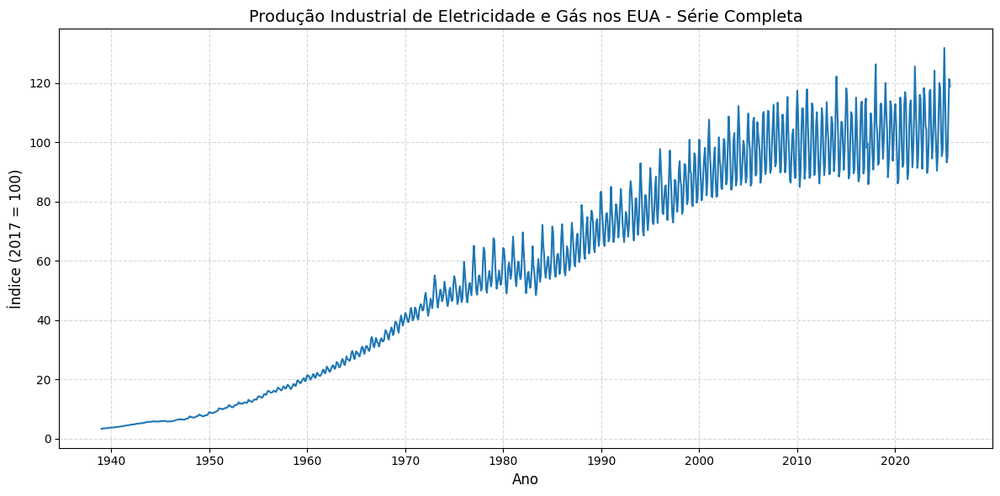

In [7]:
plot_full_time_series(
    df[[coluna_numerica]],
    title=f"{titulo_da_serie} - Série Completa",
    xlabel="Ano",
    ylabel="Índice (2017 = 100)"
)


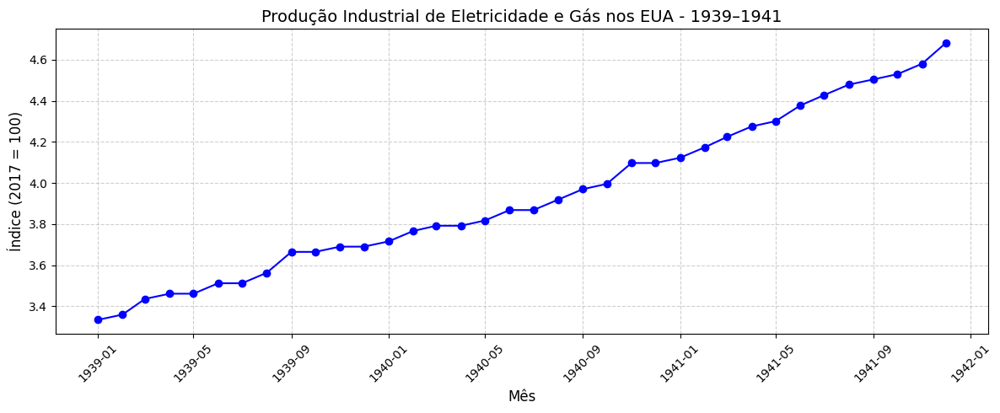

In [8]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(1939,1941),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

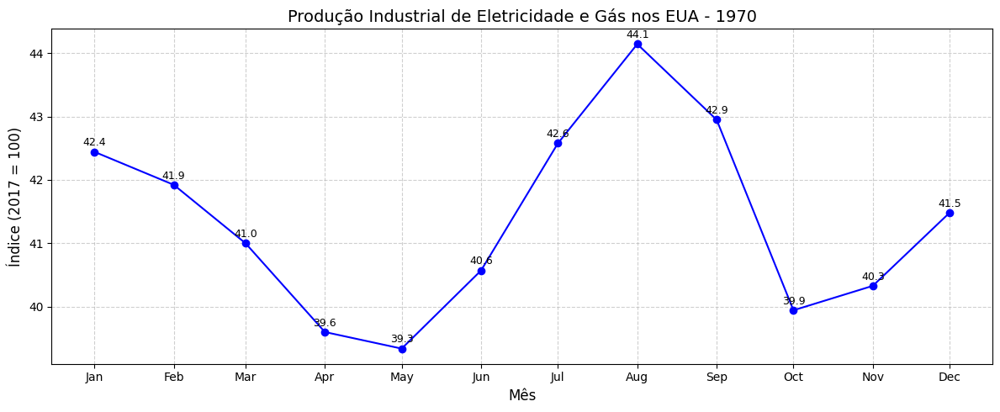

In [9]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(1970),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

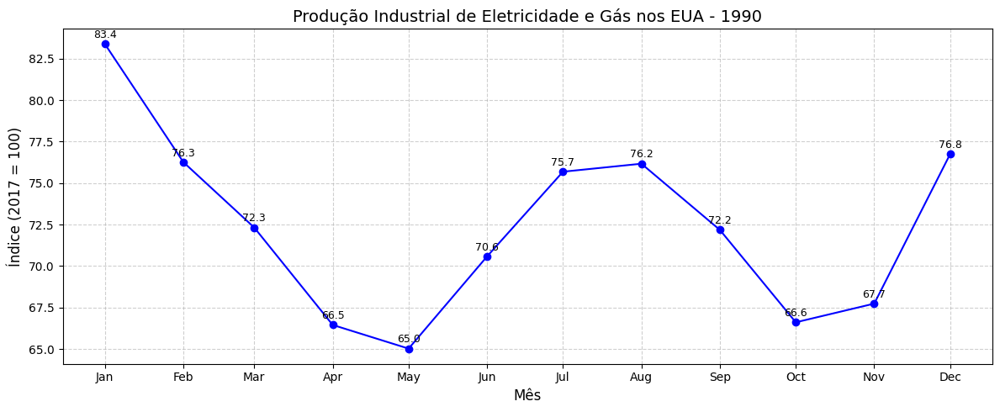

In [10]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=1990,
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

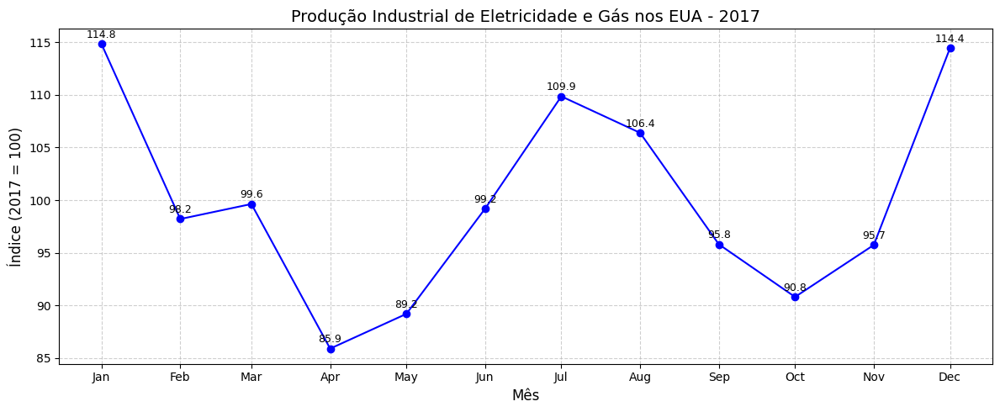

In [11]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=2017,
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

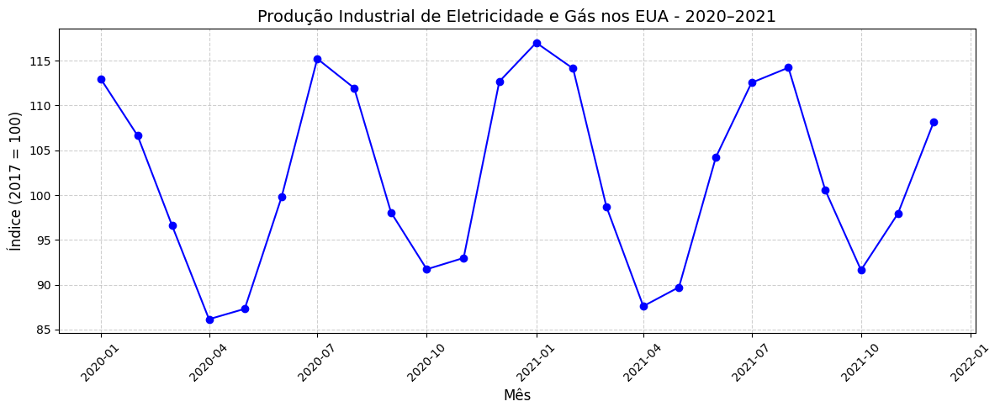

In [12]:
plot_annual_trend(
    df,
    column=coluna_numerica,
    year=(2020, 2021),
    title=titulo_da_serie,
    xlabel="Mês",
    ylabel="Índice (2017 = 100)"
)

## **3.1. Visualizar os componentes da série**

Aqui a decomposição foi feita com a biblioteca `pmdarima`

Text(0.5, 1.0, 'Produção Industrial de Eletricidade e Gás nos EUA - Decomposição da Série')

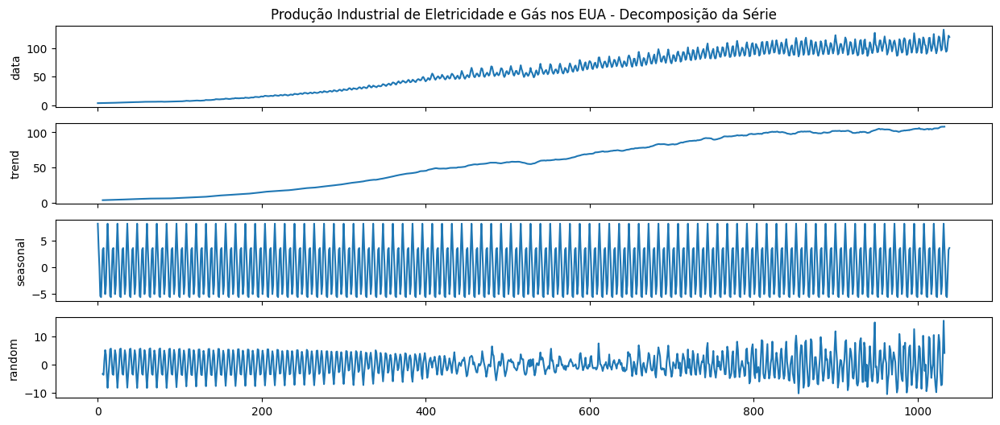

In [13]:
figure_kwargs = {'figsize': (15, 6)}  #
# Decompose the airpassengers dataset into trend, seasonal and random parts.
decomposed = pm.decompose(df.values.reshape(-1),
                             'additive', m=12)

# Plot the decomposed signal of airpassengers as a subplot

axes = utils.decomposed_plot(decomposed, figure_kwargs=figure_kwargs,
                             show=False)
axes[0].set_title(f"{titulo_da_serie} - Decomposição da Série")

<span style="color:#FFD700;">**OBSERVAÇÃO**</span>: Já é possível observar que a série tem **tendência** e **sazonalidade**, mas ainda é preciso testar a estacionariedade da série.

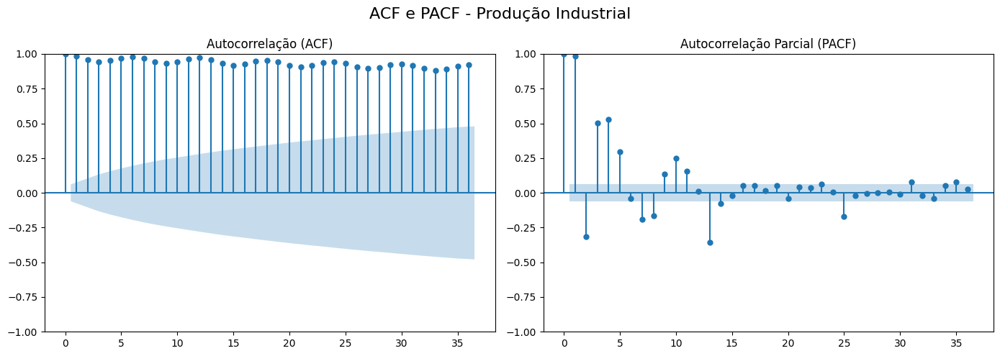

In [14]:
plot_acf_pacf(df[coluna_numerica], lags=36, title="ACF e PACF - Produção Industrial")

In [15]:
df_1970_to_2025 = df.loc['1970':]
df_1970_to_2025

,IPG2211A2N
observation_date,
1970-01-01,42.4430
1970-02-01,41.9218
1970-03-01,40.9996
1970-04-01,39.5975
1970-05-01,39.3354
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


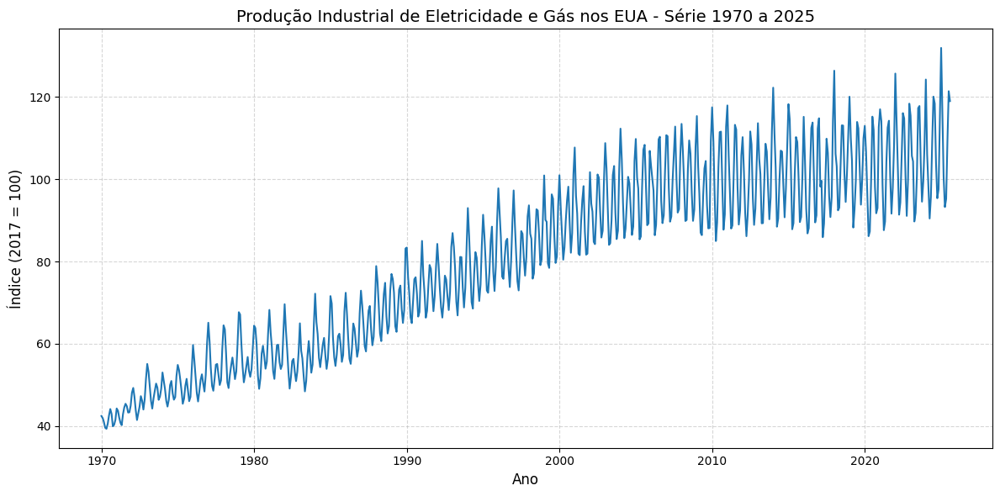

In [16]:
plot_full_time_series(
    df_1970_to_2025[[coluna_numerica]],
    title=f"{titulo_da_serie} - Série 1970 a 2025",
    xlabel="Ano",
    ylabel="Índice (2017 = 100)"
)


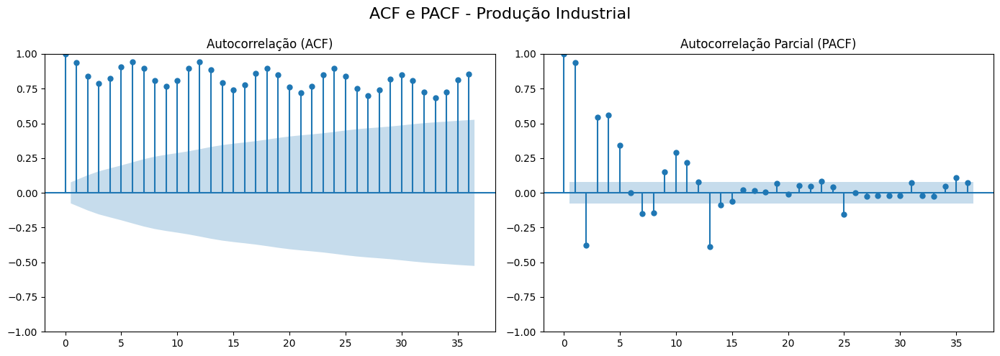

In [17]:
plot_acf_pacf(df_1970_to_2025[coluna_numerica], lags=36, title="ACF e PACF - Produção Industrial")

In [18]:
caminho_dataset = Path('../data/processed/IPG2211A2N_1970_to_2025.csv')


df_1970_to_2025_resetado = df_1970_to_2025.reset_index()


df_1970_to_2025_resetado.to_csv(caminho_dataset, index=False)

# **4. Testar a estacionariedade da série**

Uma série temporal é estacionária se suas propriedades estatísticas (média, variância e autocorrelação) não mudam ao longo do tempo.

Uma `série temporal estacionária `
- Não possui tendência 
- Nem sazonalidade

**Aplicar o teste de Dickey-Fuller**

In [19]:
resultado = teste_adf(df_1970_to_2025)

Série NÃO é estacionária (p-valor=0.4023)
ADF Statistic: -1.7564802349538837
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569


<span style="color:#FFD700;">**RESULTADO**</span>: Como a série <span style="color:red;">**não**</span> é estacionária, não poderíamos utilizar modelos clássicos como **AR**, **MA**, **ARMA** diretamente, pois exigem que a série a ser modelada seja **estacionária** (média, variância e autocorrelação constantes ao longo do tempo).

É necessário realizar o tratamento da série a fim de torná-la **estacionária**.
- **Eliminar tendência**:
    - Média móvel
    - Suavização Exponencial
    - Suavização Polinomial
    - Diferenciação


# **5. Modelagem (AR, MA, ARIMA) sem a eliminação de tendência e sazonalidade**

## **5.1. Dividir os dados em treinamento e teste**

Série com 668 registros dividida em:


Treino (75%): 501
Teste (25%): 167


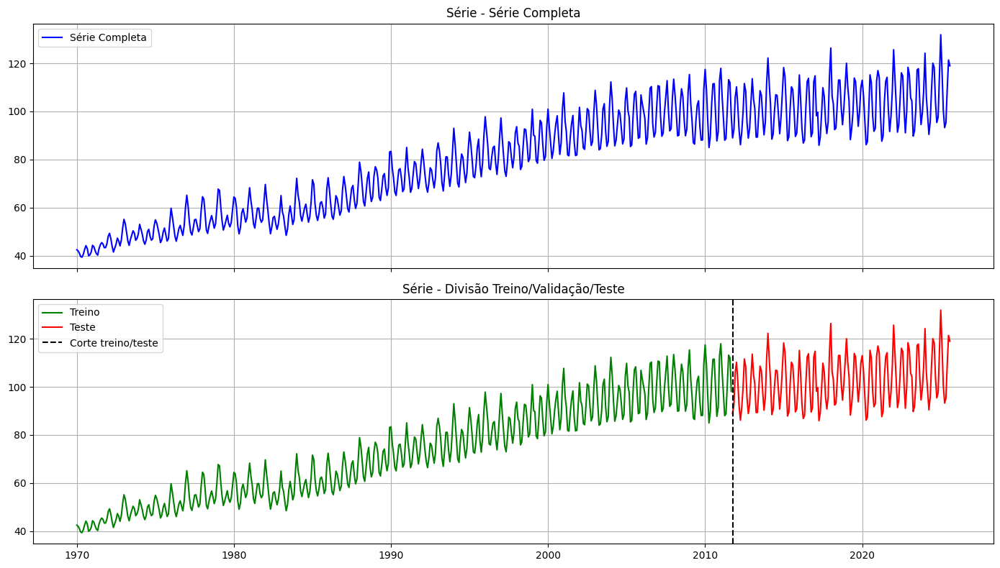

In [20]:
# Sem validação
y_train, y_test = split_series_treino_teste(df_1970_to_2025, percentual_treino=0.75)

plot_train_test_split(df_1970_to_2025, y_train, y_test)

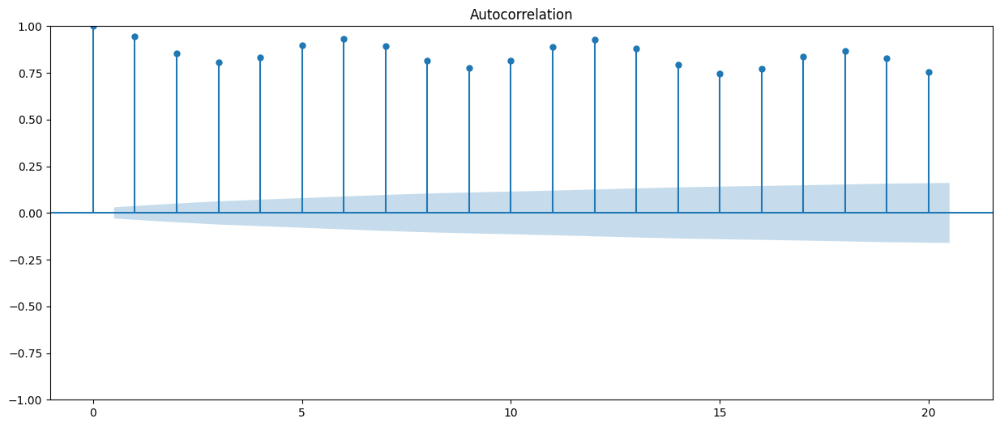

In [21]:
smt.graphics.plot_acf(y_train, lags=20, alpha=0.5)
plt.show()

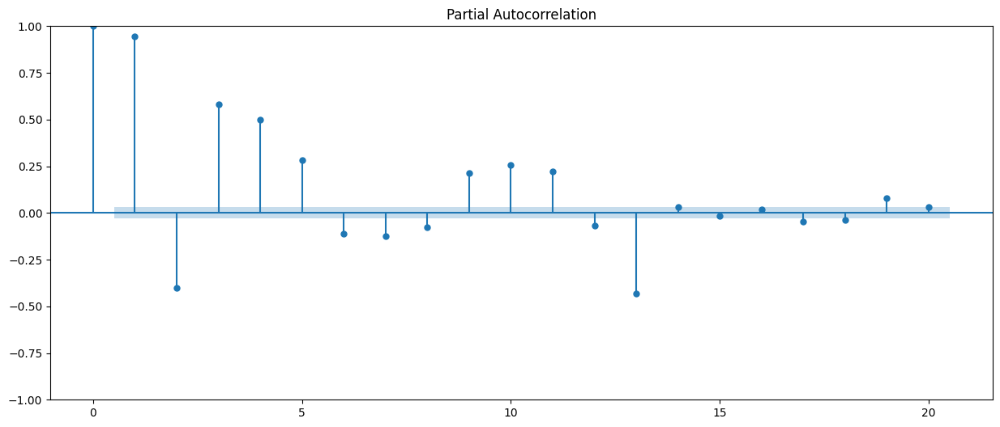

In [22]:
smt.graphics.plot_pacf(y_train, lags=20, alpha=0.5)
plt.show()

## **5.2. Aplicar o modelo**

Embora se saiba que a série em questão não é estacionária, o que inviabiliza o uso adequado de modelos puramente AR (Auto-Regressivo), MA (Médias Móveis) e ARMA (Auto-Regressivo com Médias Móveis), esses modelos foram ainda assim aplicados.

O objetivo da execução foi ilustrar como esses modelos se comportam diante de uma série não-estacionária.

### **5.2.1. Modelo AR**

#### **5.2.1.1. AR(2)**

Rodando AR(2) com order=(2, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


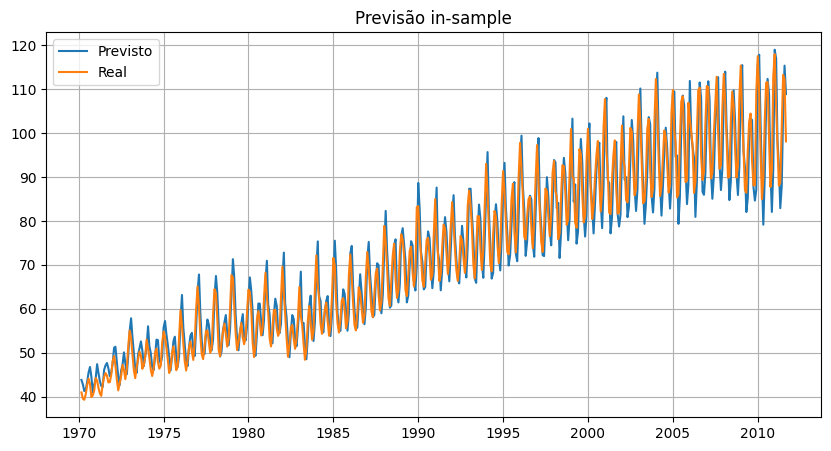


Etapa 3 - Análise de Resíduos In-Sample


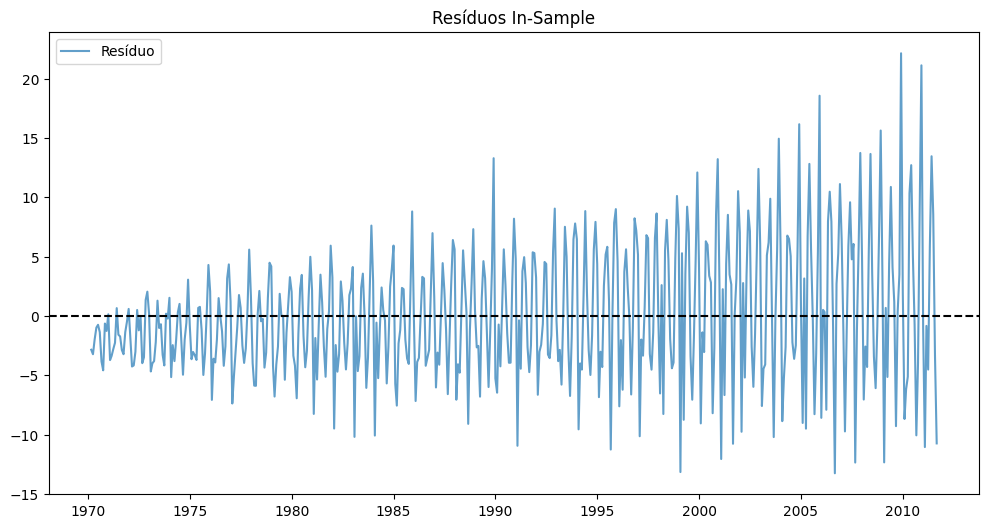

Média: 0.0714, Desvio-padrão: 5.5824

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=872.2078, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=1924.0979, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

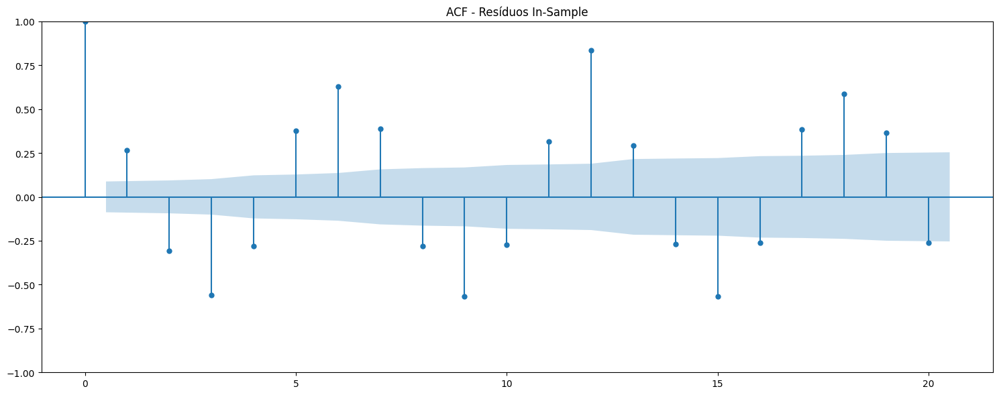


Etapa 4 - Previsões Out-of-Sample


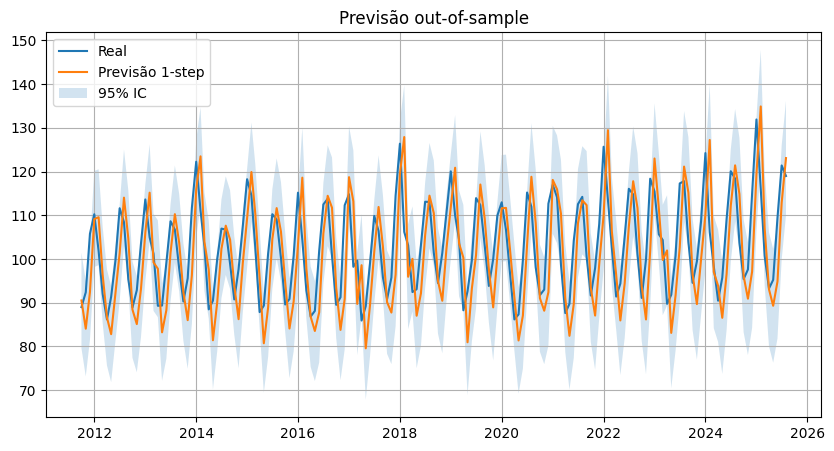


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 7.9176
MAPE: 0.0766
MSE: 84.8508

Etapa 6 - Análise de Resíduos Out-of-Sample


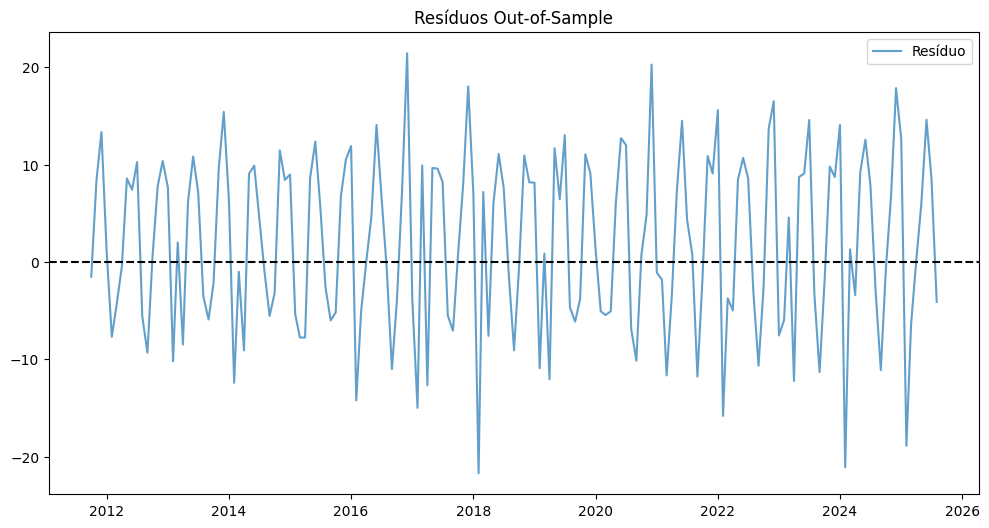

Média: 1.9391, Desvio-padrão: 9.0321

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=311.8616, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=634.6322, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

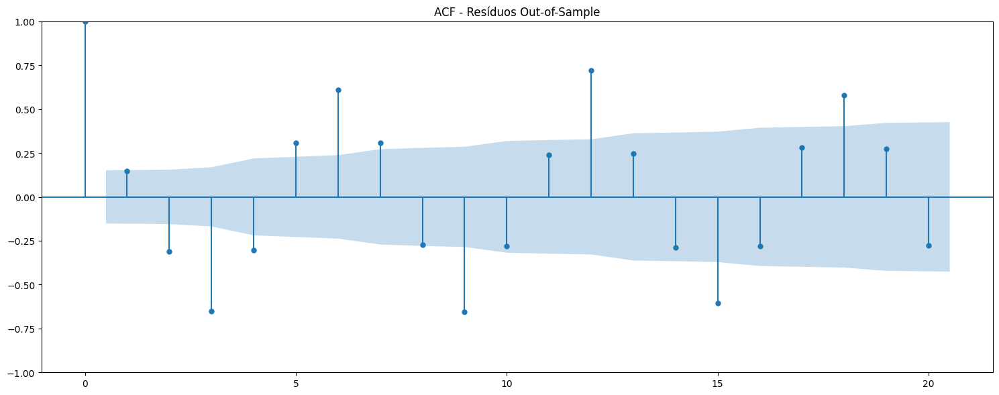


Pipeline finalizado!
Tempo total de execução: 0.43 minutos


In [23]:
resultado_ar_2 = rodar_modelo_arima(y_train, y_test, order=(2,0,0), nome_modelo="AR(2)")

#### **5.2.1.2. AR(6)**

Rodando AR(6) com order=(6, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


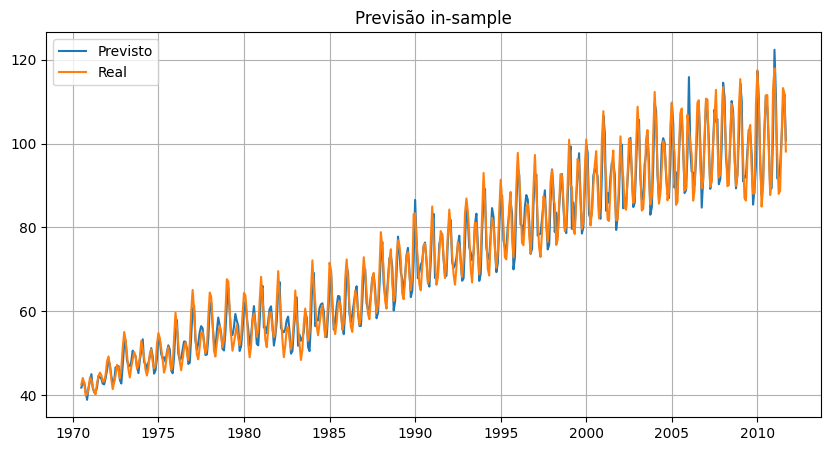


Etapa 3 - Análise de Resíduos In-Sample


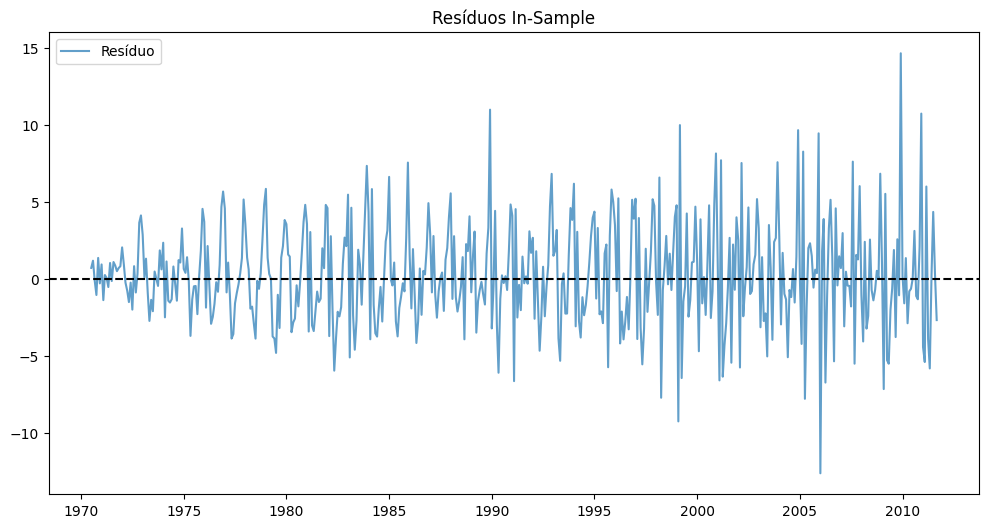

Média: 0.2623, Desvio-padrão: 3.3261

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=133.7294, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=448.0978, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

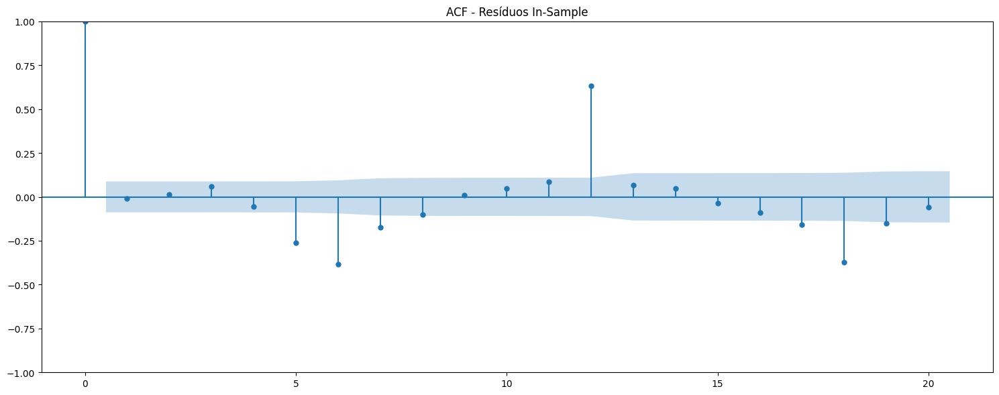


Etapa 4 - Previsões Out-of-Sample


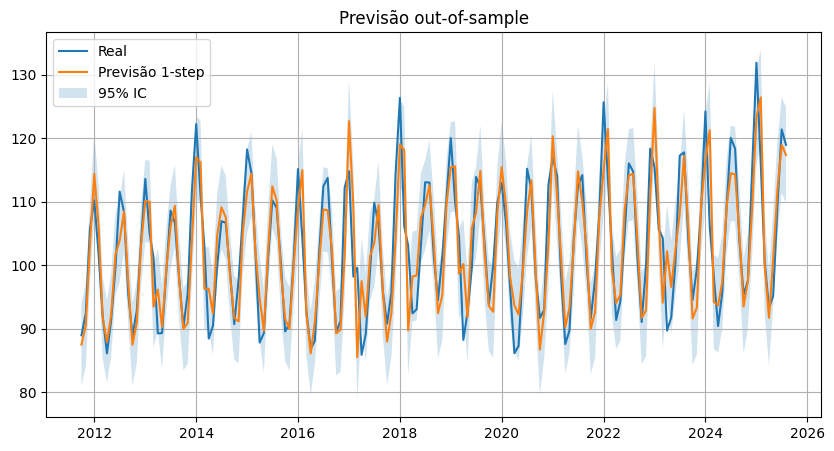


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.9157
MAPE: 0.0378
MSE: 26.7396

Etapa 6 - Análise de Resíduos Out-of-Sample


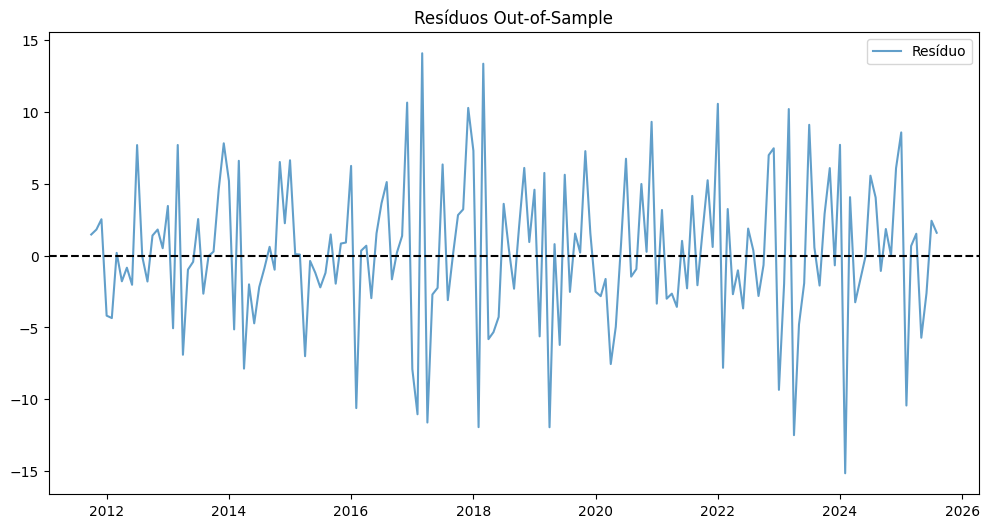

Média: 0.2134, Desvio-padrão: 5.1822

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=35.7609, p-valor=0.0001 → Autocorrelação detectada
Lag 20: estatística=75.7734, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

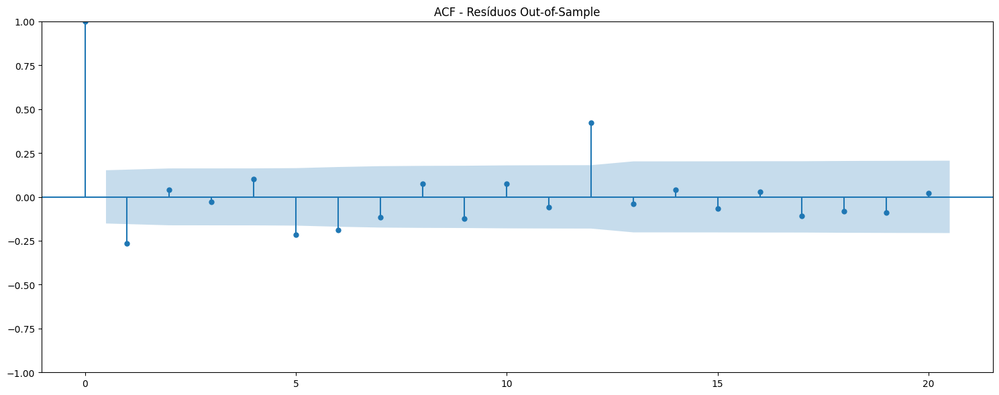


Pipeline finalizado!
Tempo total de execução: 1.34 minutos


In [24]:
resultado_ar_6 = rodar_modelo_arima(y_train, y_test, order=(6,0,0), nome_modelo="AR(6)")

#### **5.2.1.3. AR(12)**

Rodando AR(12) com order=(12, 0, 0) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


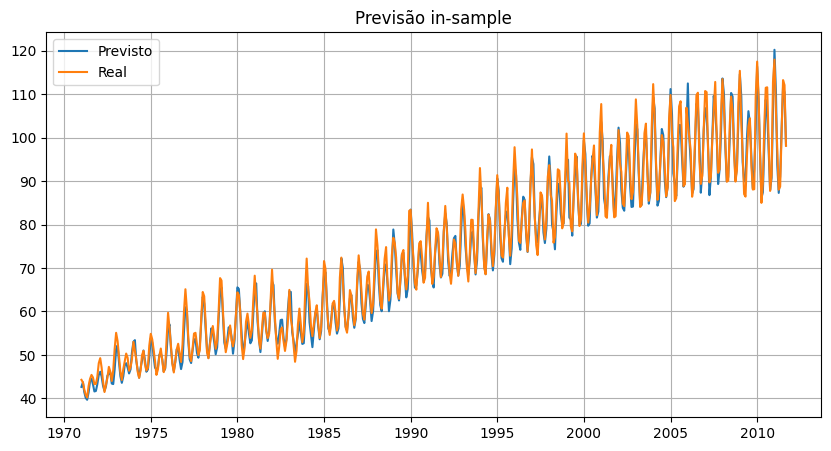


Etapa 3 - Análise de Resíduos In-Sample


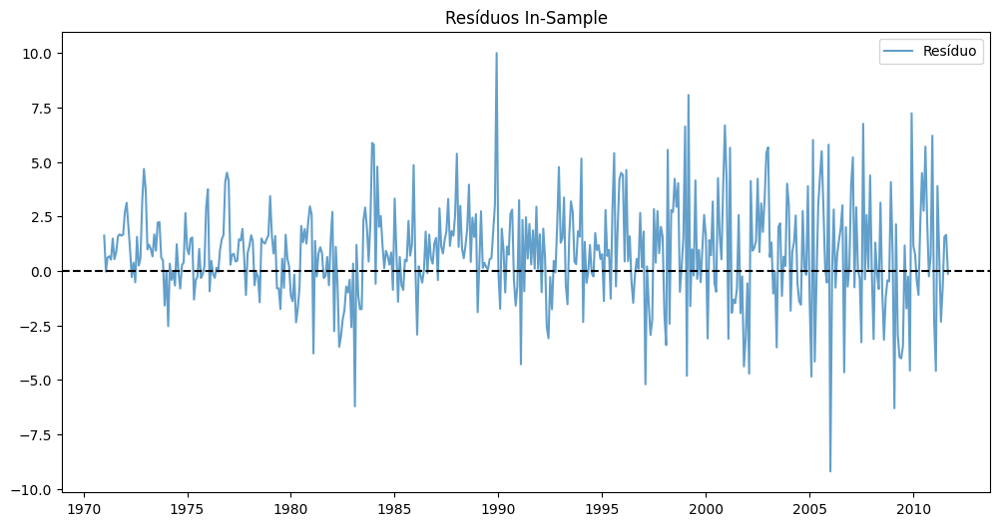

Média: 0.8035, Desvio-padrão: 2.2992

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=31.0366, p-valor=0.0006 → Autocorrelação detectada
Lag 20: estatística=88.1278, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

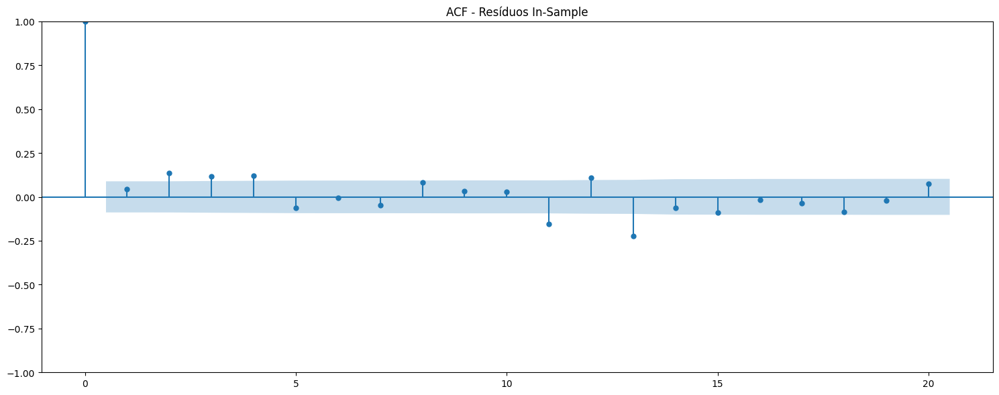


Etapa 4 - Previsões Out-of-Sample


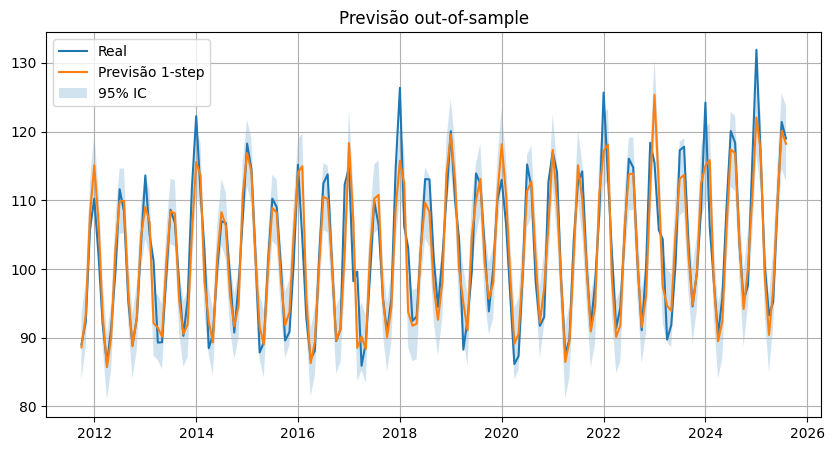


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 2.8588
MAPE: 0.0272
MSE: 14.8354

Etapa 6 - Análise de Resíduos Out-of-Sample


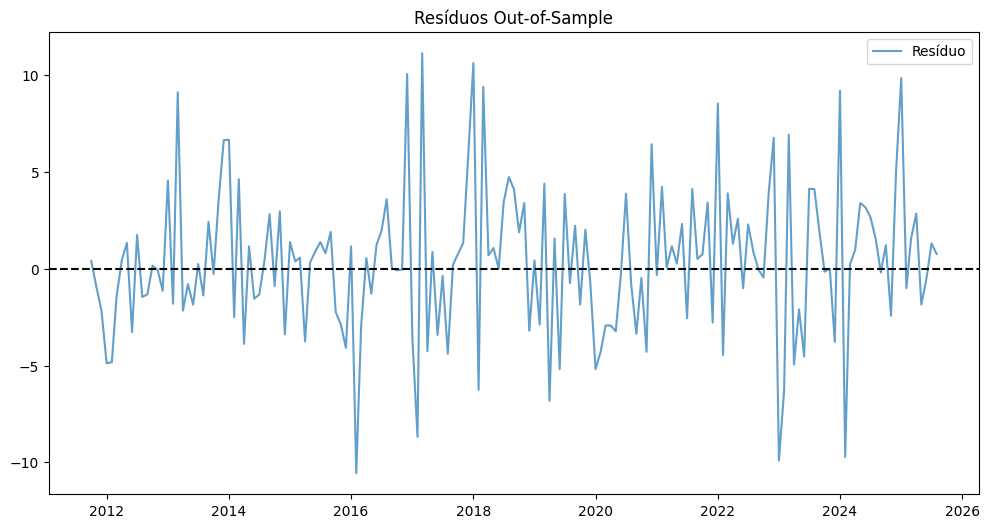

Média: 0.3388, Desvio-padrão: 3.8483

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=20.1971, p-valor=0.0274 → Autocorrelação detectada
Lag 20: estatística=29.6232, p-valor=0.0762 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

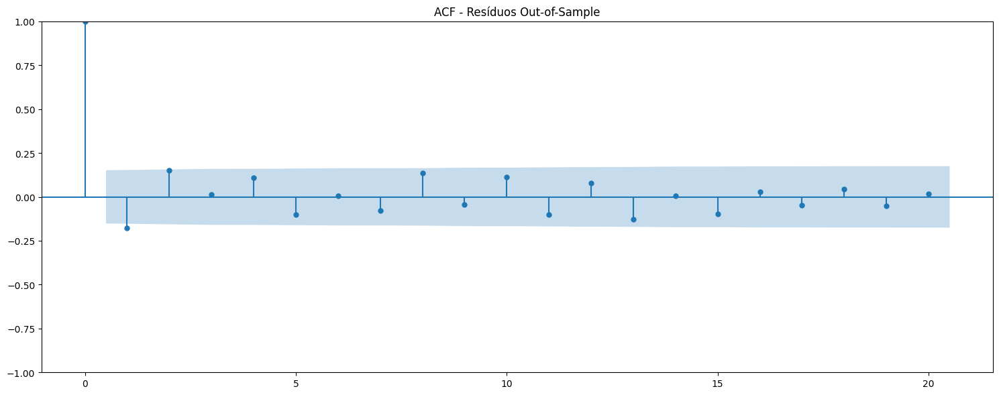


Pipeline finalizado!
Tempo total de execução: 5.99 minutos


In [25]:
resultado_ar_12 = rodar_modelo_arima(y_train, y_test, order=(12,0,0), nome_modelo="AR(12)")

### **5.2.2. Modelo MA**

#### **5.2.2.1. MA(2)**

Rodando MA(2) com order=(0, 0, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


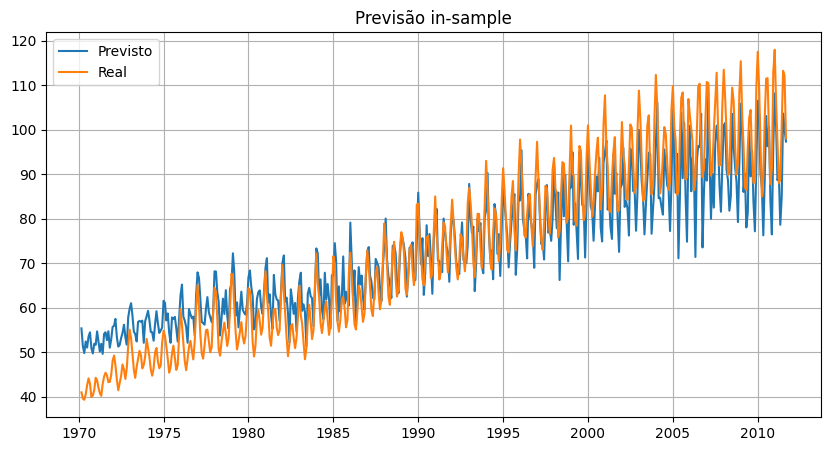


Etapa 3 - Análise de Resíduos In-Sample


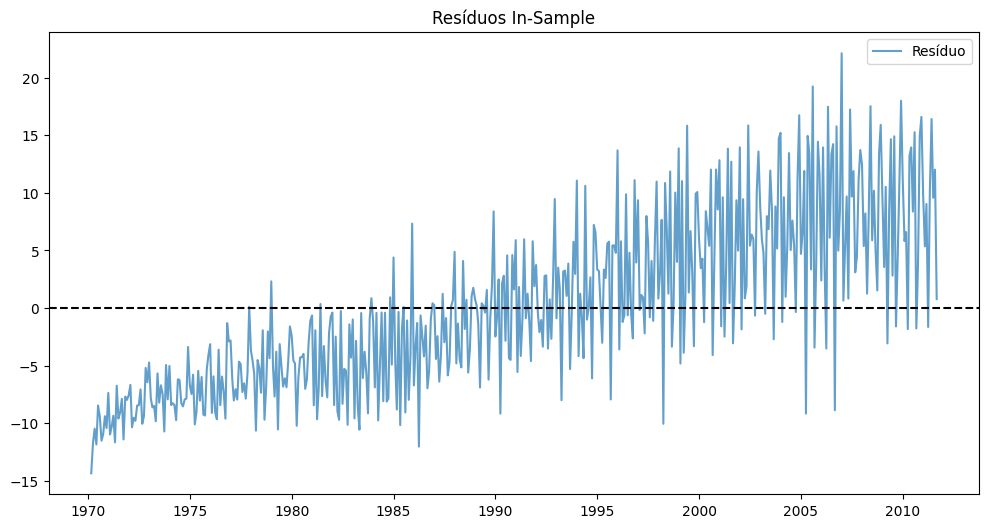

Média: 0.0536, Desvio-padrão: 7.3988

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=1727.8282, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=3511.9052, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

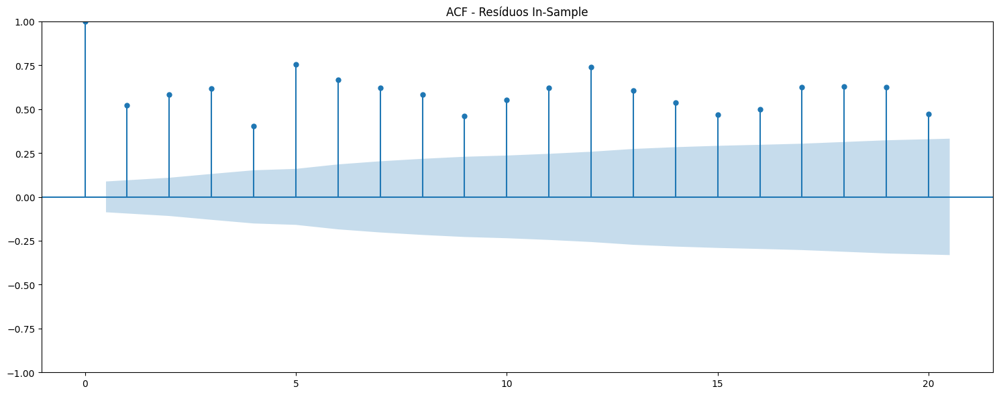


Etapa 4 - Previsões Out-of-Sample


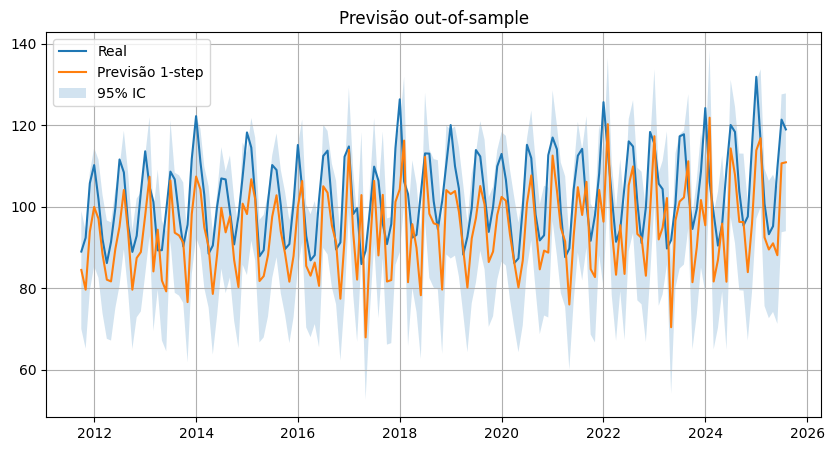


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 9.7708
MAPE: 0.0938
MSE: 138.8404

Etapa 6 - Análise de Resíduos Out-of-Sample


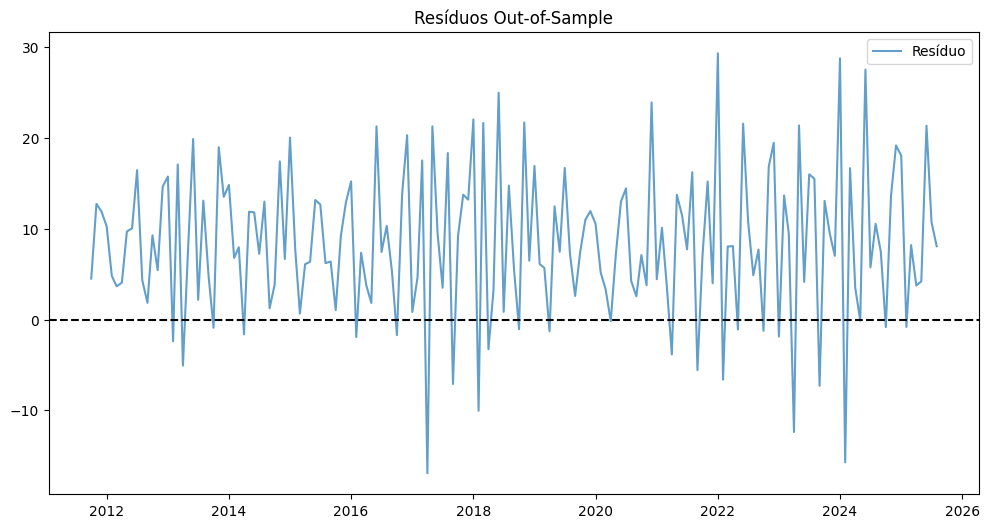

Média: 8.4396, Desvio-padrão: 8.2475

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=177.1028, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=232.6711, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

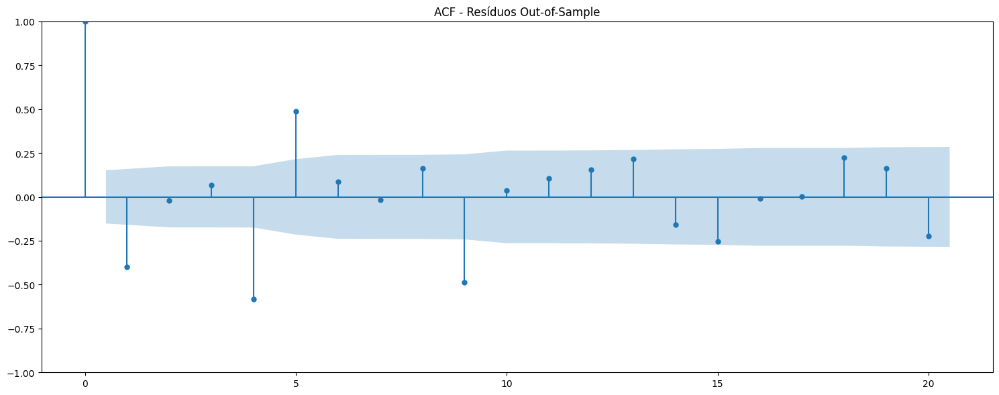


Pipeline finalizado!
Tempo total de execução: 0.49 minutos


In [26]:
resultado_ma_2 = rodar_modelo_arima(y_train, y_test, order=(0,0,2), nome_modelo="MA(2)")

#### **5.2.2.2. MA(6)**

Rodando MA(6) com order=(0, 0, 6) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


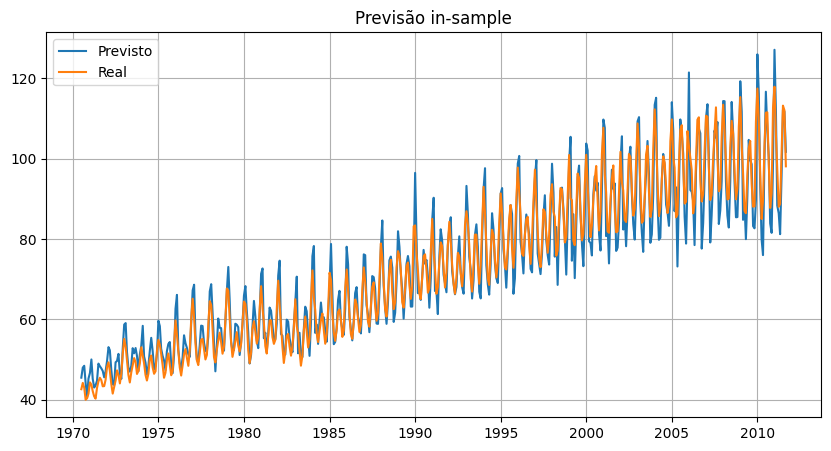


Etapa 3 - Análise de Resíduos In-Sample


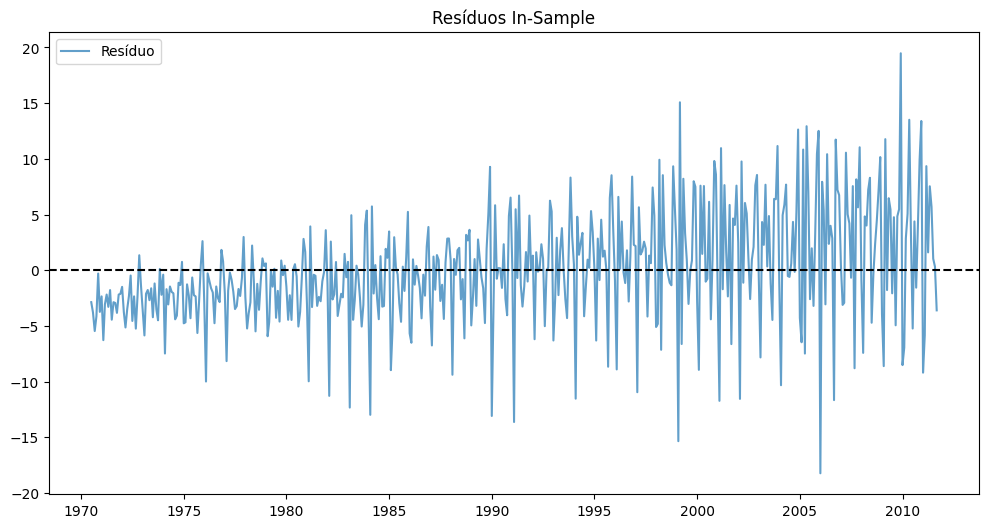

Média: 0.0285, Desvio-padrão: 5.0746

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=134.5611, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=519.1582, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

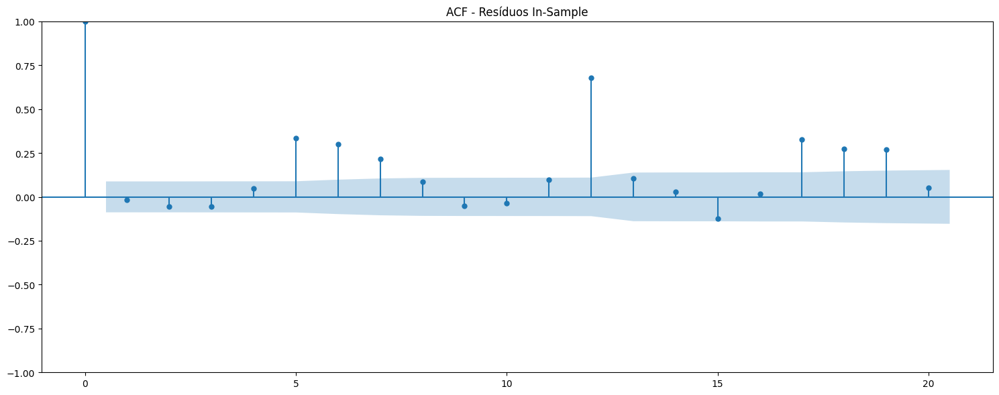


Etapa 4 - Previsões Out-of-Sample


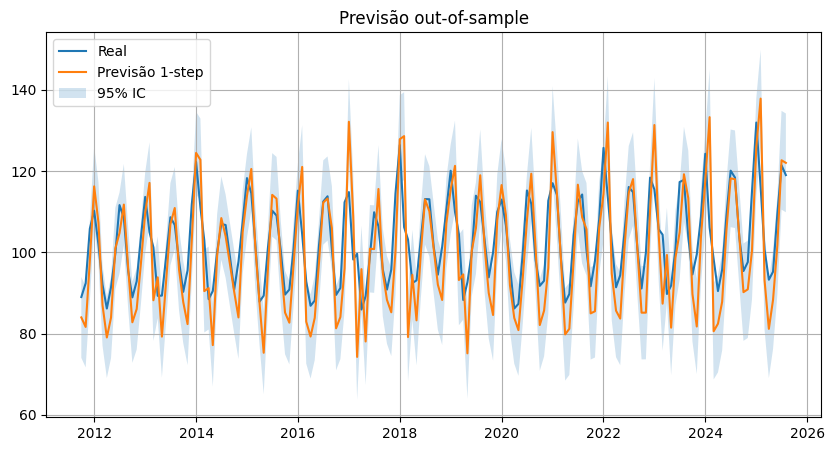


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 7.1034
MAPE: 0.0699
MSE: 80.8714

Etapa 6 - Análise de Resíduos Out-of-Sample


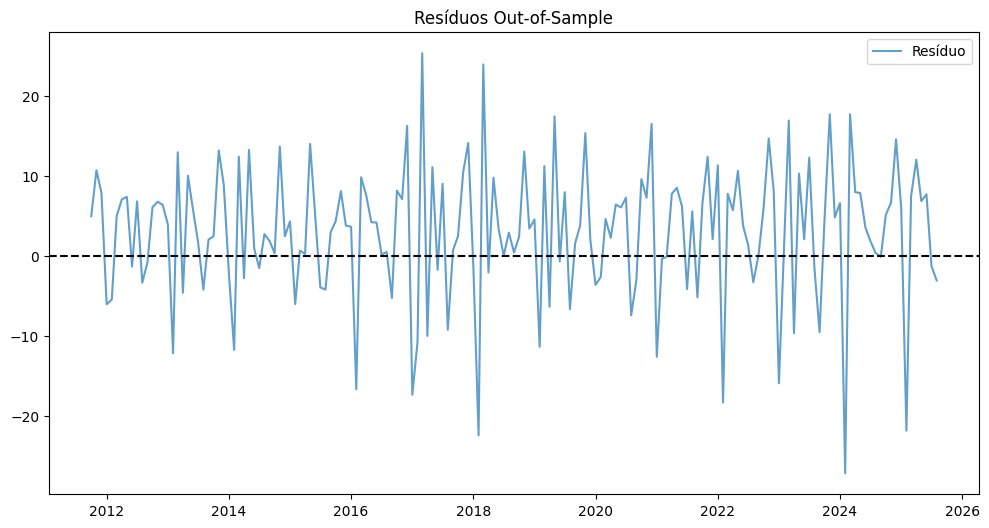

Média: 3.0243, Desvio-padrão: 8.4945

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=60.5635, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=144.2578, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

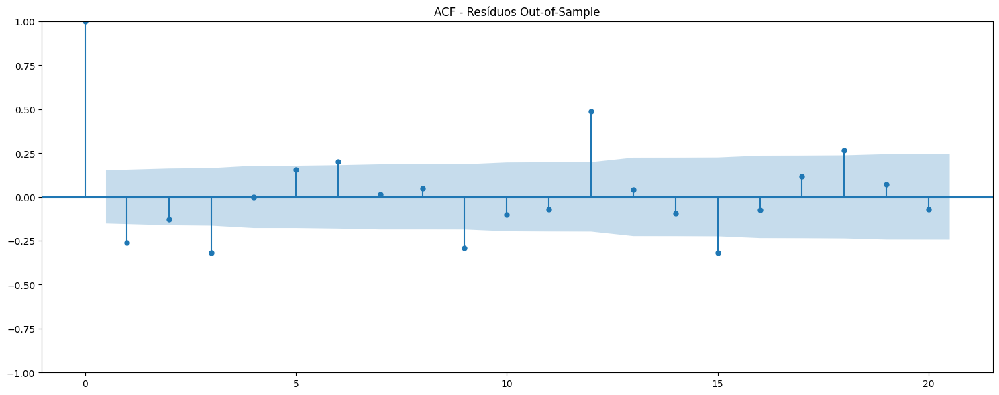


Pipeline finalizado!
Tempo total de execução: 1.14 minutos


In [27]:
resultado_ma_6 = rodar_modelo_arima(y_train, y_test, order=(0,0,6), nome_modelo="MA(6)")

#### **5.2.2.3. MA(12)**

Rodando MA(12) com order=(0, 0, 12) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


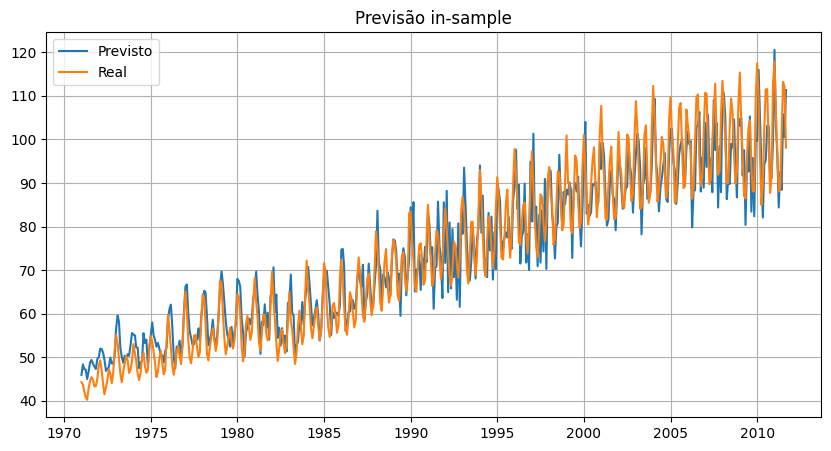


Etapa 3 - Análise de Resíduos In-Sample


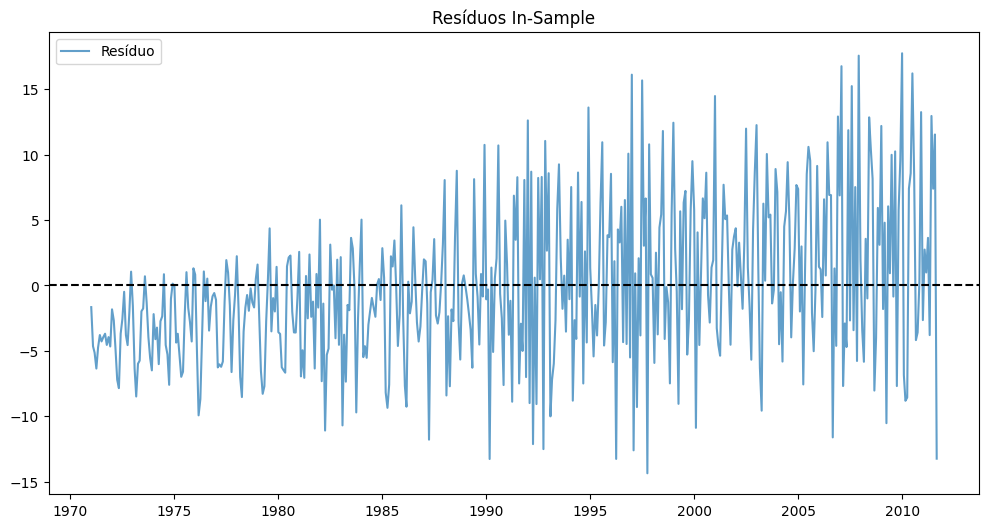

Média: -0.2118, Desvio-padrão: 5.9589

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=337.8362, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=667.0466, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

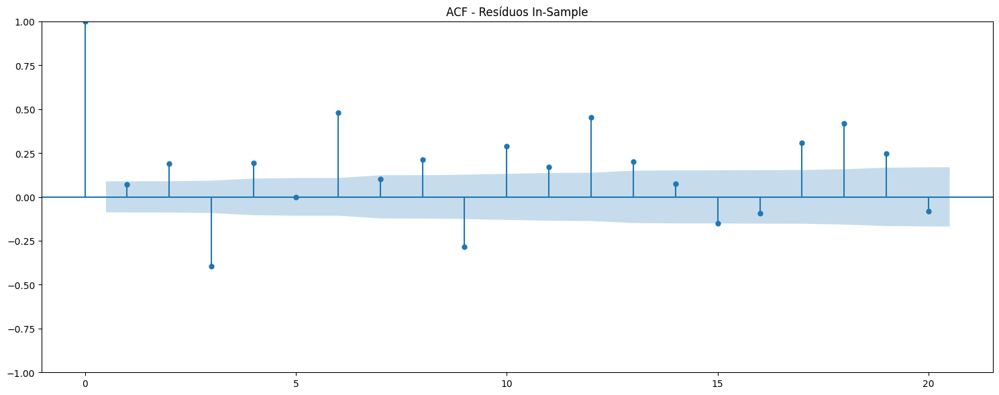


Etapa 4 - Previsões Out-of-Sample


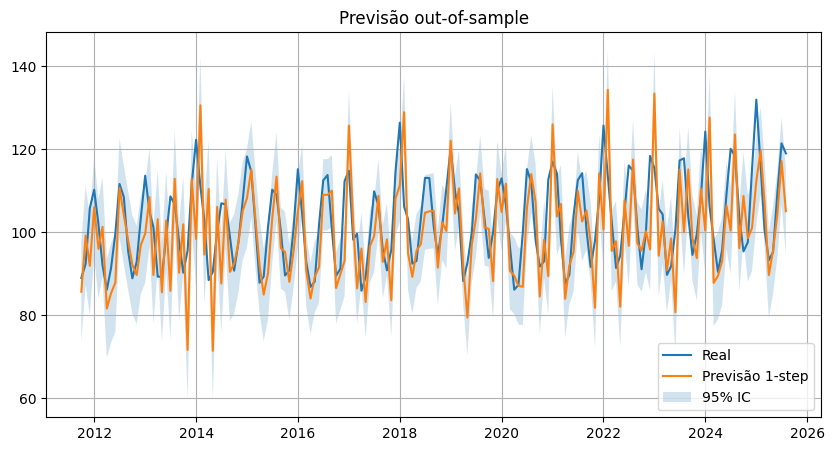


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 7.8876
MAPE: 0.0754
MSE: 101.2094

Etapa 6 - Análise de Resíduos Out-of-Sample


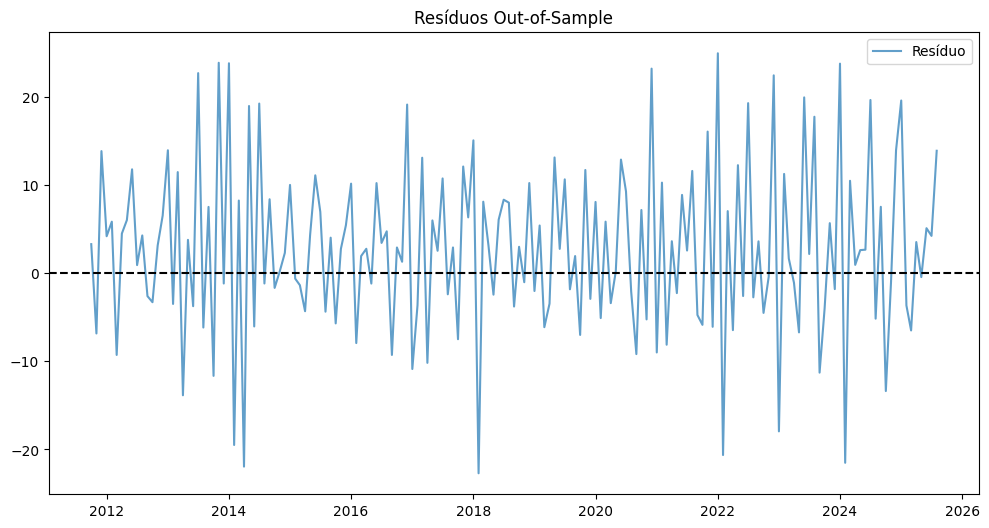

Média: 2.7772, Desvio-padrão: 9.6985

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=147.5262, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=218.8327, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

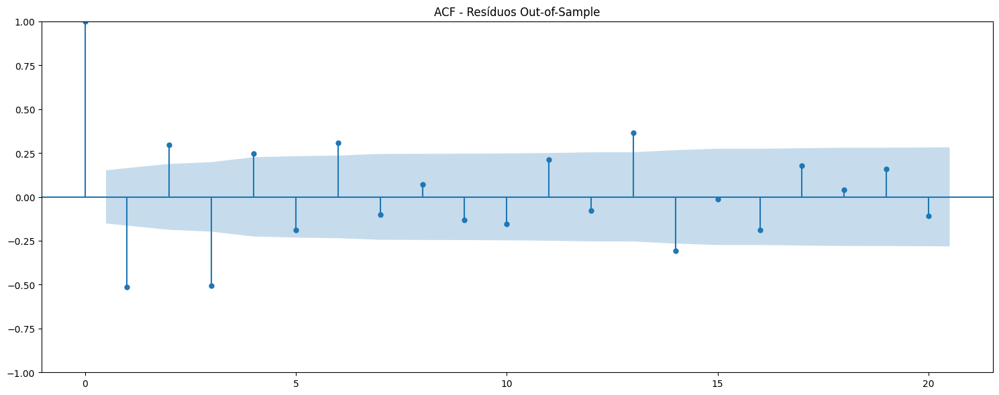


Pipeline finalizado!
Tempo total de execução: 6.31 minutos


In [28]:
resultado_ma_12 = rodar_modelo_arima(y_train, y_test, order=(0,0,12), nome_modelo="MA(12)")

### **5.2.3. Modelo ARMA**

#### **5.2.3.1. ARMA(2,2)**

Rodando ARMA(2,2) com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


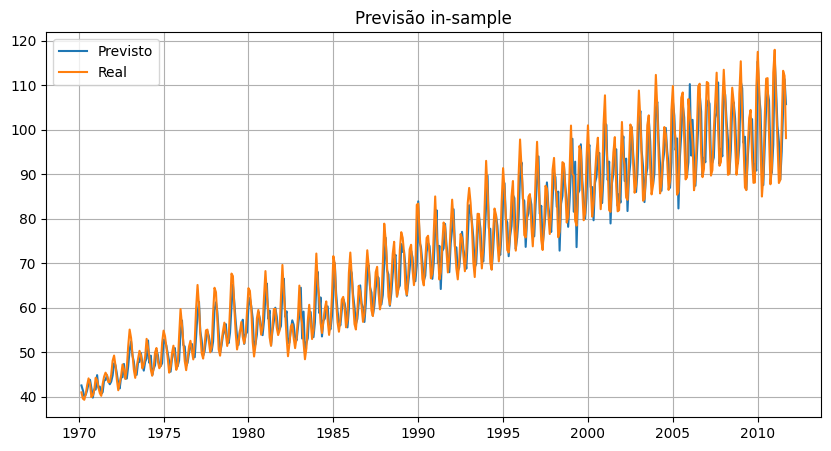


Etapa 3 - Análise de Resíduos In-Sample


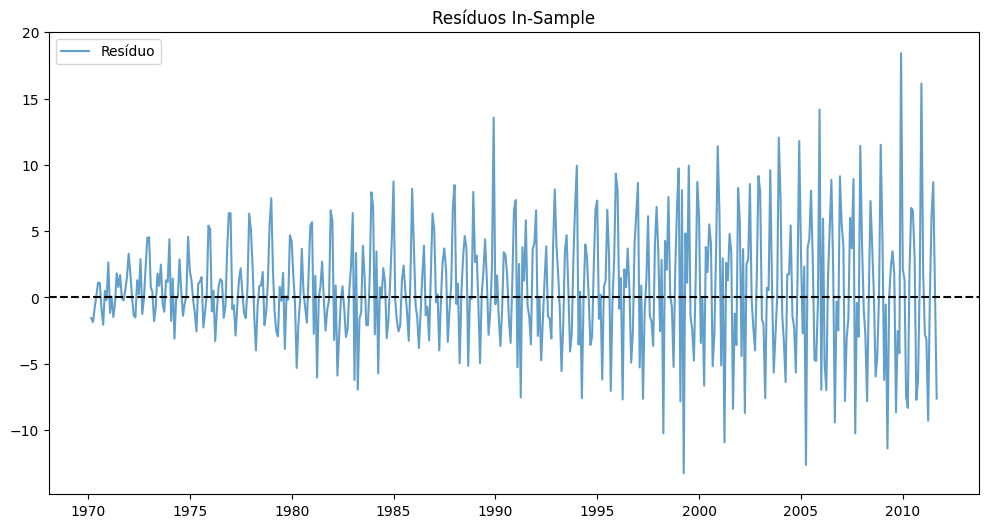

Média: 0.6879, Desvio-padrão: 4.4616

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=669.5099, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=1478.9931, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

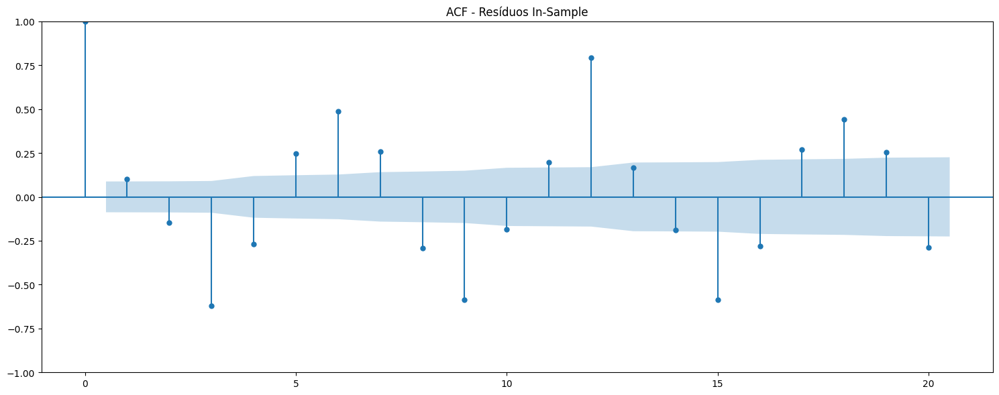


Etapa 4 - Previsões Out-of-Sample


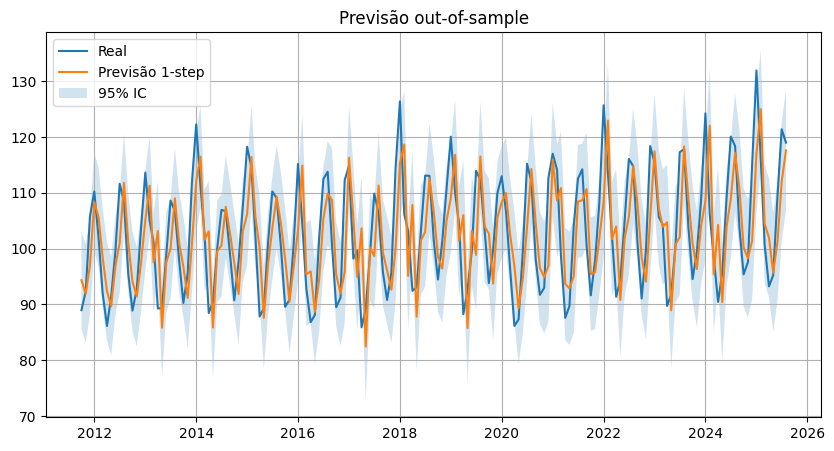


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 6.2787
MAPE: 0.0611
MSE: 59.1699

Etapa 6 - Análise de Resíduos Out-of-Sample


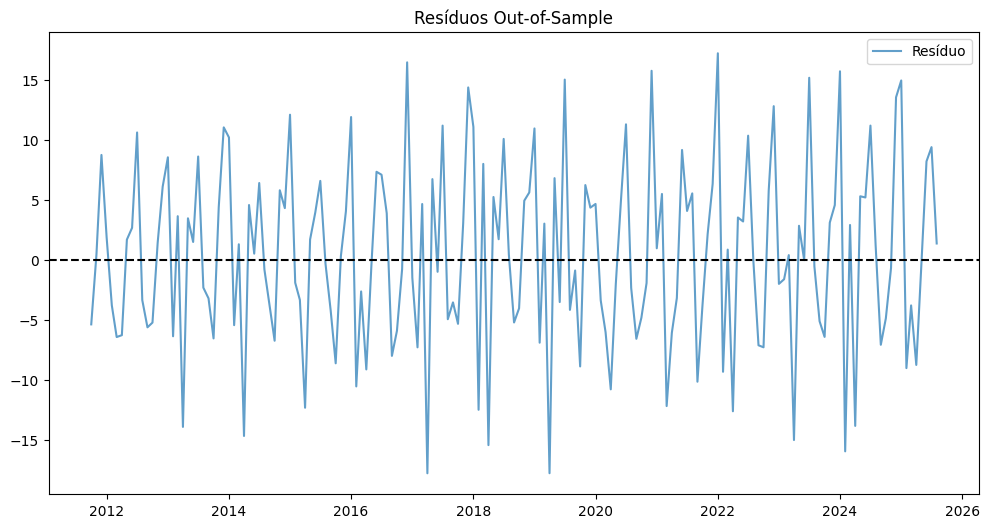

Média: 0.3945, Desvio-padrão: 7.7052

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=221.0459, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=441.5968, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

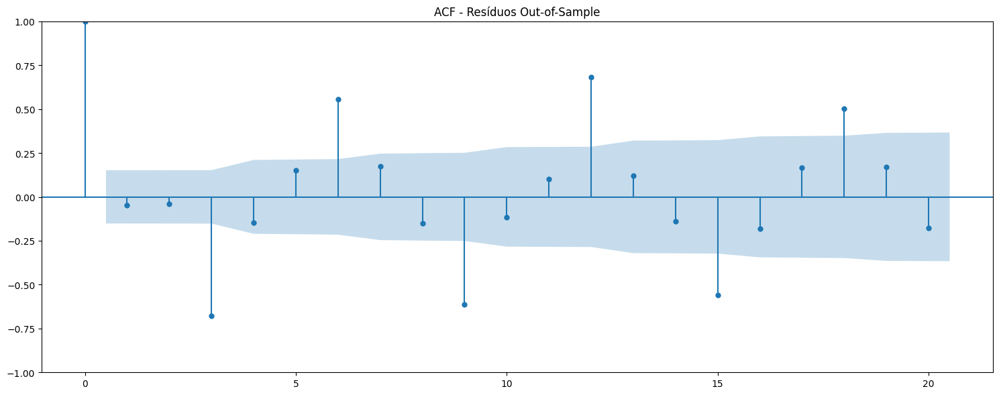


Pipeline finalizado!
Tempo total de execução: 0.72 minutos


In [29]:
resultado_arma_2_2 = rodar_modelo_arima(y_train, y_test, order=(2,0,2), nome_modelo="ARMA(2,2)")

#### **5.2.3.2. ARMA(6,3)**

Rodando ARMA(6,3) com order=(6, 0, 3) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


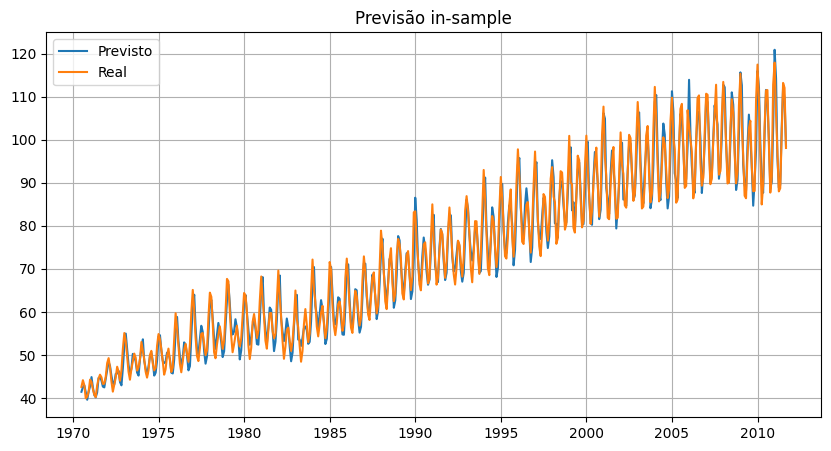


Etapa 3 - Análise de Resíduos In-Sample


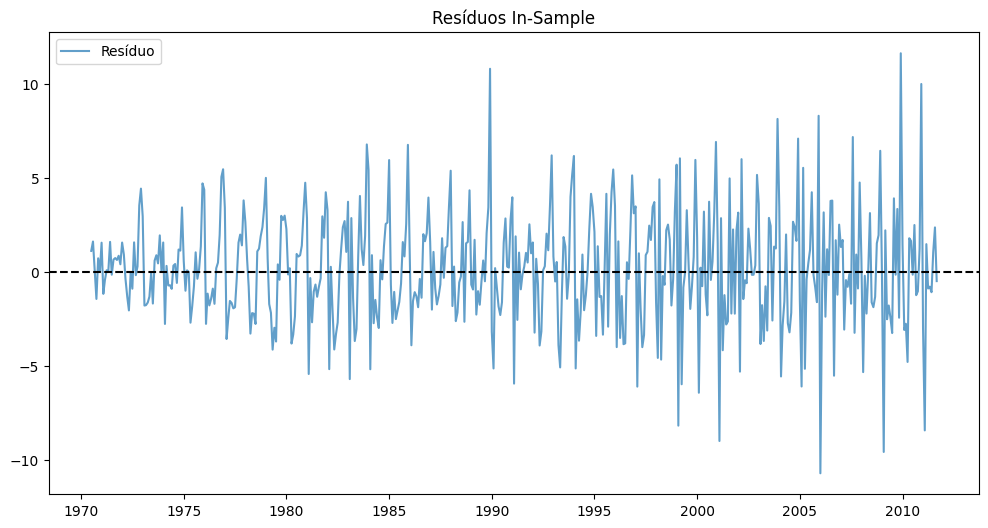

Média: 0.1864, Desvio-padrão: 2.9608

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=129.1633, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=425.1557, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

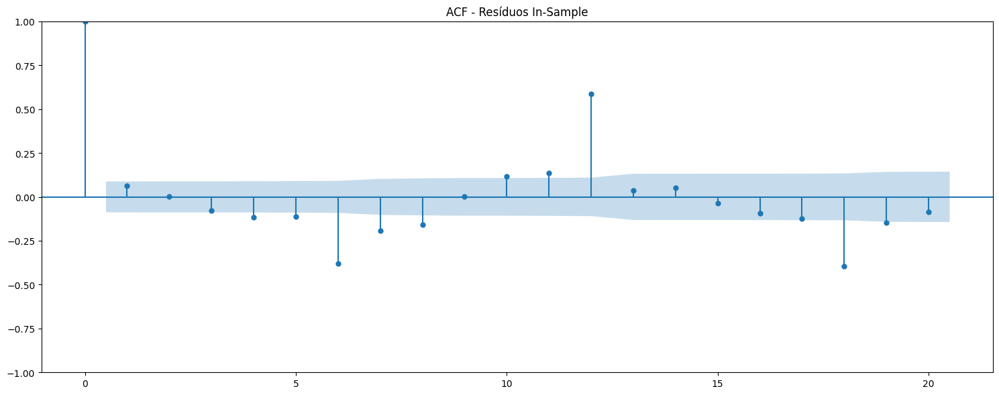


Etapa 4 - Previsões Out-of-Sample


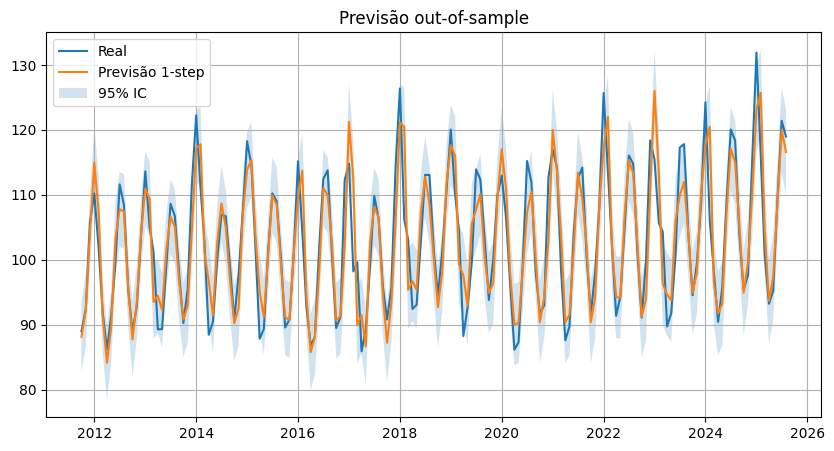


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.3495
MAPE: 0.0321
MSE: 20.4266

Etapa 6 - Análise de Resíduos Out-of-Sample


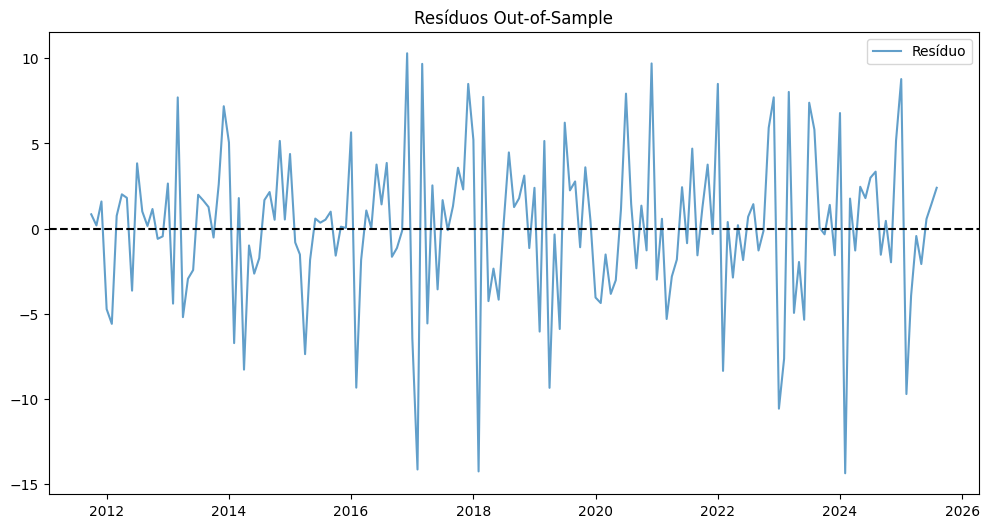

Média: 0.0571, Desvio-padrão: 4.5328

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=23.4522, p-valor=0.0092 → Autocorrelação detectada
Lag 20: estatística=56.9283, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

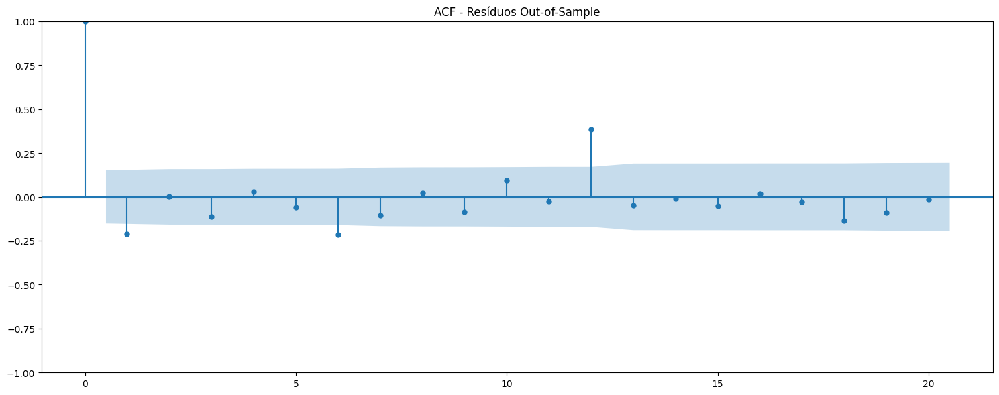


Pipeline finalizado!
Tempo total de execução: 1.40 minutos


In [30]:
resultado_arma_6_3 = rodar_modelo_arima(y_train, y_test, order=(6,0,3), nome_modelo="ARMA(6,3)")

### **5.2.4. Modelo ARIMA**

<span style="color:red;">**TODO**</span>: checar se uma diferenciação é suficiente!


#### **5.2.4.1. ARIMA(2,1,2)**

Rodando ARIMA(2,1,2) com order=(2, 1, 2) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


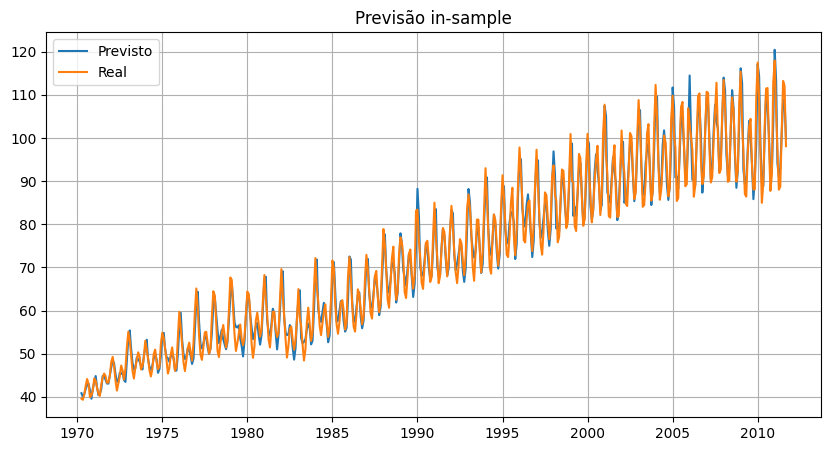


Etapa 3 - Análise de Resíduos In-Sample


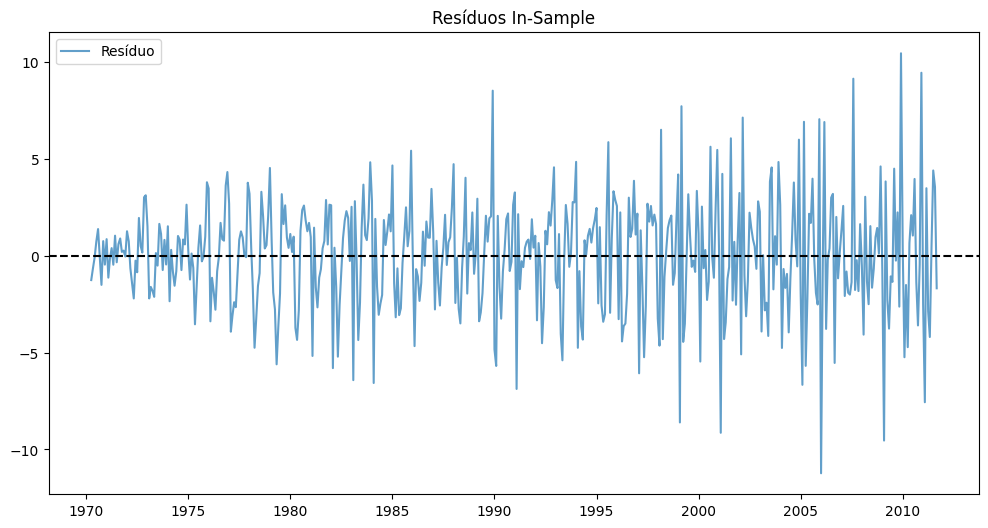

Média: -0.0048, Desvio-padrão: 2.8738

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=84.1751, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=330.7802, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

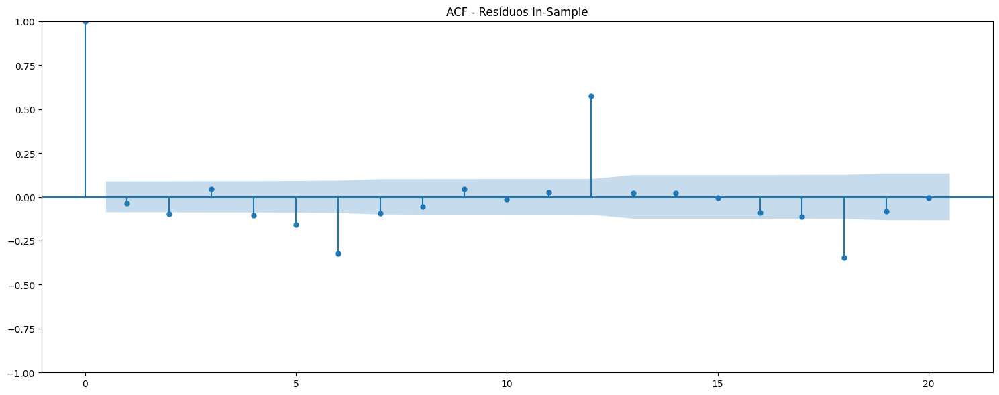


Etapa 4 - Previsões Out-of-Sample


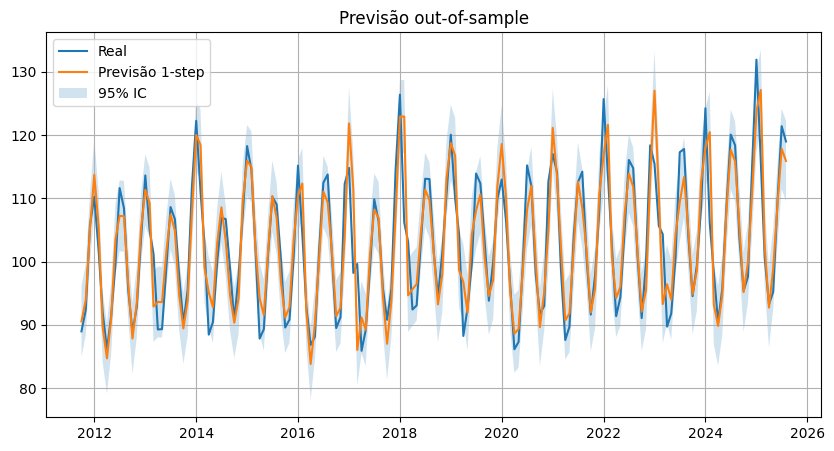


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.3540
MAPE: 0.0322
MSE: 20.1398

Etapa 6 - Análise de Resíduos Out-of-Sample


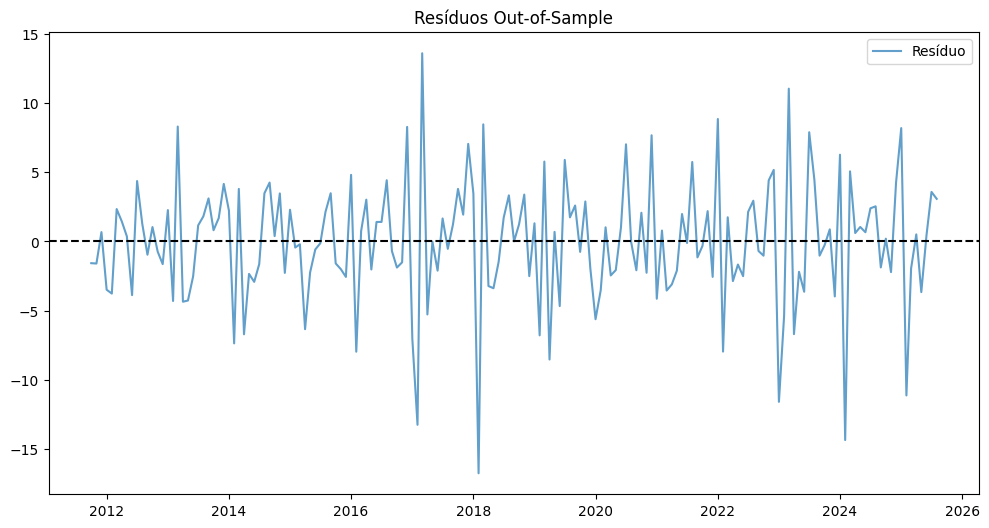

Média: -0.0719, Desvio-padrão: 4.5007

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=29.8070, p-valor=0.0009 → Autocorrelação detectada
Lag 20: estatística=59.9386, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

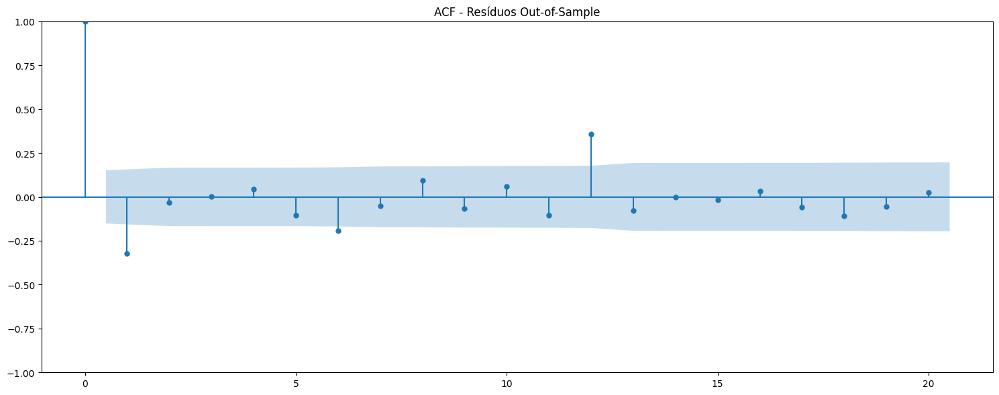


Pipeline finalizado!
Tempo total de execução: 0.56 minutos


In [31]:
resultado_arima_2_1_2 = rodar_modelo_arima(y_train, y_test, order=(2,1,2), nome_modelo="ARIMA(2,1,2)")

#### **5.2.4.2. ARIMA(6,1,3)**

Rodando ARIMA(6,1,3) com order=(6, 1, 3) seasonal_order=(0, 0, 0, 0)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


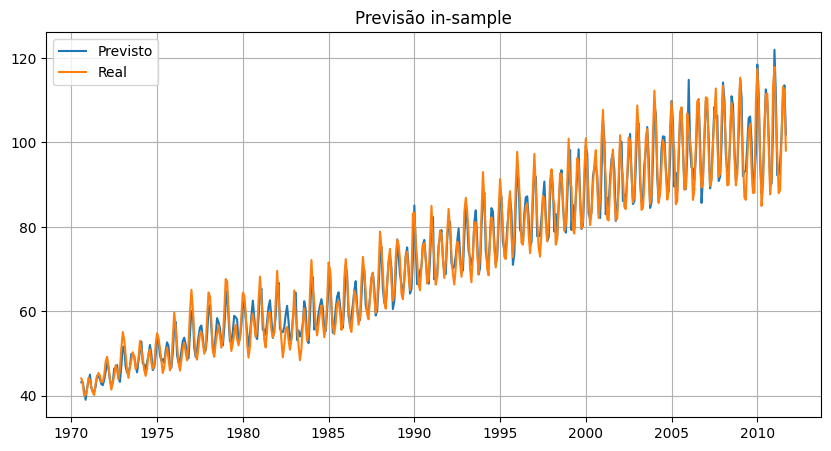


Etapa 3 - Análise de Resíduos In-Sample


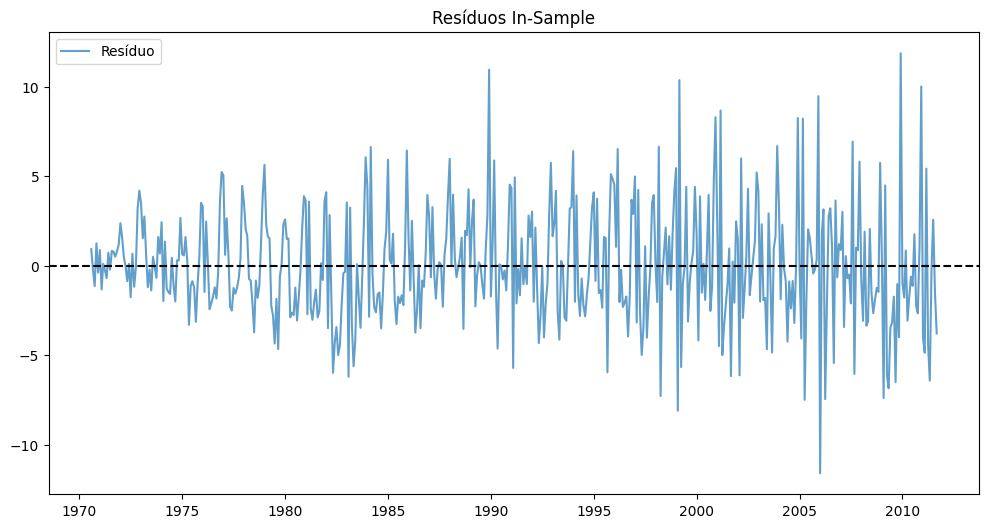

Média: 0.0094, Desvio-padrão: 3.1826

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=73.7597, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=328.8402, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

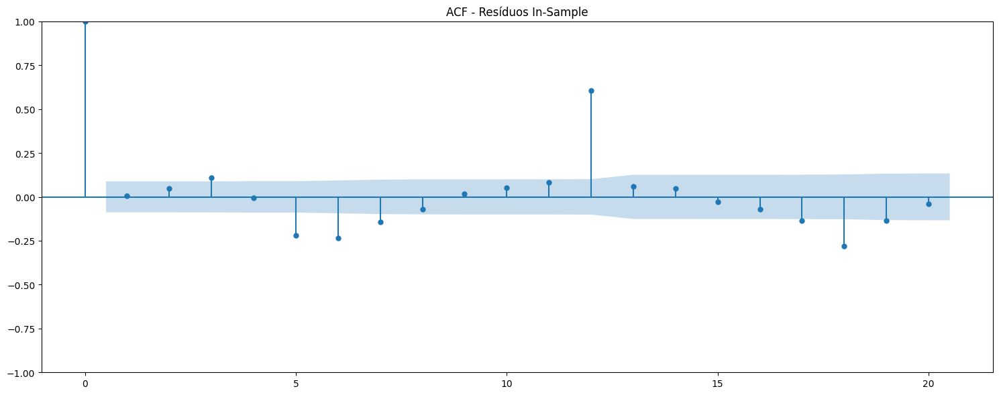


Etapa 4 - Previsões Out-of-Sample


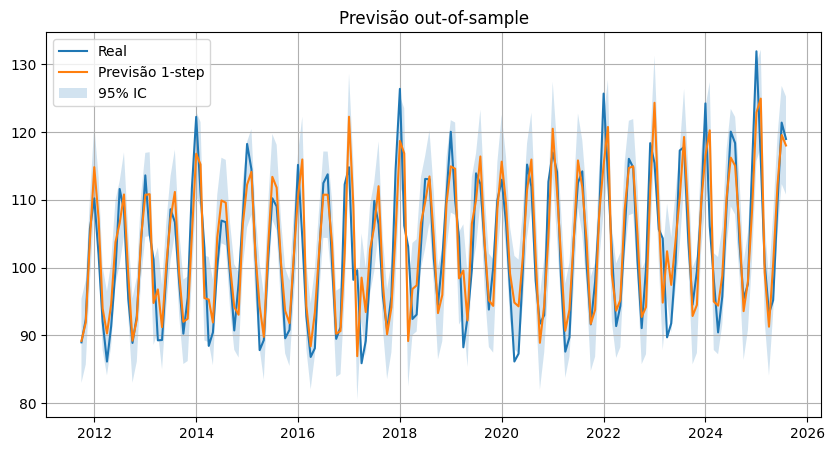


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 3.9352
MAPE: 0.0383
MSE: 25.1520

Etapa 6 - Análise de Resíduos Out-of-Sample


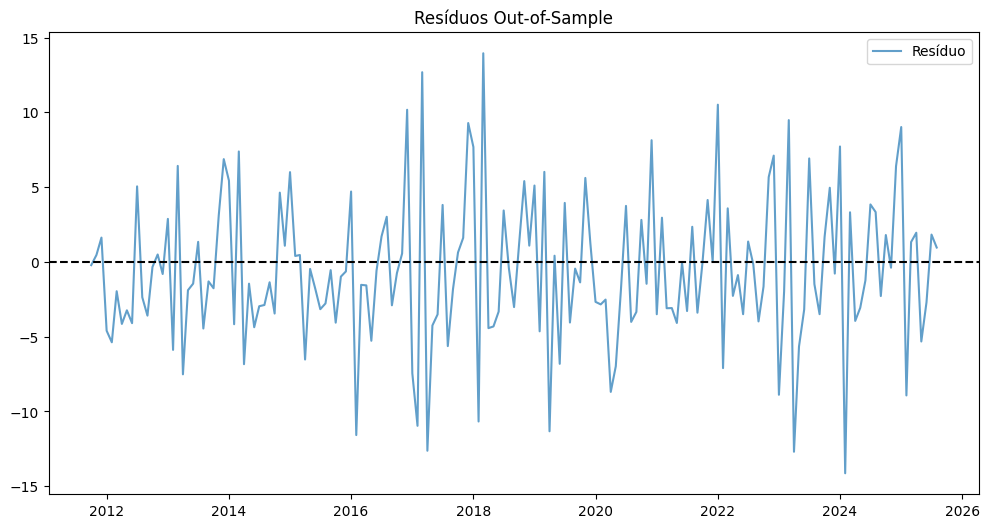

Média: -0.6559, Desvio-padrão: 4.9871

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=29.3846, p-valor=0.0011 → Autocorrelação detectada
Lag 20: estatística=66.2523, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

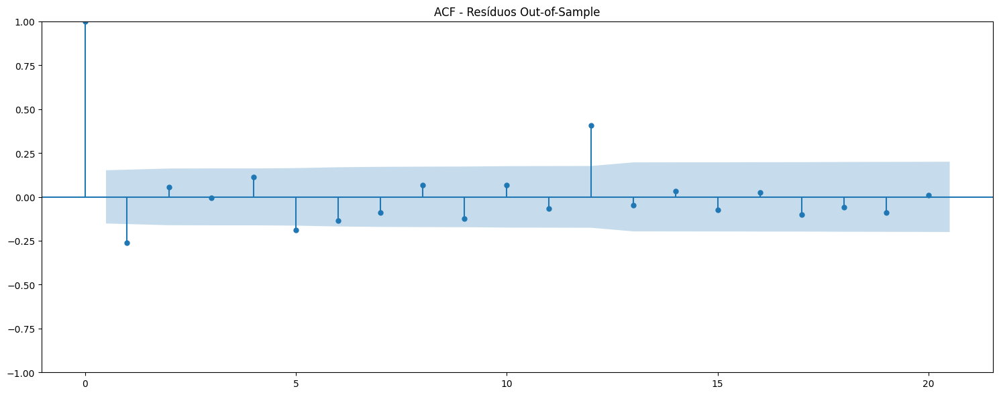


Pipeline finalizado!
Tempo total de execução: 1.38 minutos


In [32]:
resultado_arima_6_1_3 = rodar_modelo_arima(y_train, y_test, order=(6,1,3), nome_modelo="ARIMA(6,1,3)")

### **5.2.5. AUTO ARIMA**

#### **5.2.5.1. AUTO ARIMA SEM SAZONALIDADE**

In [33]:
model_AutoARIMA = Pipeline(
    [
        ##('boxcox', BoxCoxEndogTransformer()),
        (
            "auto - arima",
            pm.AutoARIMA(
                trace=True,
                suppress_warnings=True,
                max_p=10,
                stepwise=True,
                seasonal=False,
                m=6,
            ),
        )
    ]
)

model_AutoARIMA.fit(y_train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=2491.059, Time=1.93 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=3247.679, Time=0.09 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=3172.860, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=3081.028, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=3245.840, Time=0.17 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=2633.925, Time=0.68 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=2494.549, Time=1.89 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=2.65 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=3082.309, Time=0.56 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=1.66 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=2632.182, Time=0.77 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=2496.751, Time=3.23 sec
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=inf, Time=0.86 sec

Best model:  ARIMA(2,1,2)(0,0,0)[0] intercept
Total 

,steps,"[('auto - arima', ...)]"


In [34]:
# Já executado
# resultado_arima_2_1_2 = rodar_modelo_arima(y_train, y_test, order=(2,1,2), nome_modelo="ARIMA(2,1,2)")

#### **5.2.5.1. AUTO ARIMA COM SAZONALIDADE**

In [35]:
model_AutoARIMA = Pipeline(
    [
        ##('boxcox', BoxCoxEndogTransformer()),
        (
            "auto - arima",
            pm.AutoARIMA(
                trace=True,
                suppress_warnings=True,
                max_p=10,
                stepwise=True,
                seasonal=True,
                m=6,
            ),
        )
    ]
)

model_AutoARIMA.fit(y_train)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[6] intercept   : AIC=inf, Time=7.06 sec
 ARIMA(0,1,0)(0,0,0)[6] intercept   : AIC=3247.679, Time=0.10 sec
 ARIMA(1,1,0)(1,0,0)[6] intercept   : AIC=2875.881, Time=0.49 sec
 ARIMA(0,1,1)(0,0,1)[6] intercept   : AIC=3029.125, Time=0.67 sec
 ARIMA(0,1,0)(0,0,0)[6]             : AIC=3245.840, Time=0.15 sec
 ARIMA(1,1,0)(0,0,0)[6] intercept   : AIC=3172.860, Time=0.20 sec
 ARIMA(1,1,0)(2,0,0)[6] intercept   : AIC=inf, Time=3.48 sec
 ARIMA(1,1,0)(1,0,1)[6] intercept   : AIC=2504.341, Time=1.43 sec
 ARIMA(1,1,0)(0,0,1)[6] intercept   : AIC=3075.100, Time=0.75 sec
 ARIMA(1,1,0)(2,0,1)[6] intercept   : AIC=2329.991, Time=6.93 sec
 ARIMA(1,1,0)(2,0,2)[6] intercept   : AIC=2201.328, Time=9.05 sec
 ARIMA(1,1,0)(1,0,2)[6] intercept   : AIC=2423.544, Time=4.49 sec
 ARIMA(0,1,0)(2,0,2)[6] intercept   : AIC=2208.575, Time=6.47 sec
 ARIMA(2,1,0)(2,0,2)[6] intercept   : AIC=2167.888, Time=9.01 sec
 ARIMA(2,1,0)(1,0,2)[6] intercept   : AIC=2

,steps,"[('auto - arima', ...)]"


Rodando SARIMA(3,1,1)(2,0,2)[6] com order=(3, 1, 1) seasonal_order=(2, 0, 2, 6)

Etapa 1 - Treinamento do Modelo

Etapa 2 - Previsões In-Sample


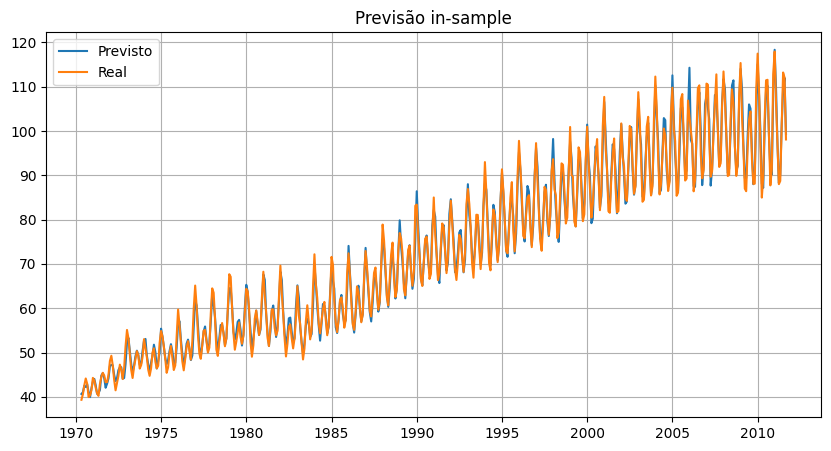


Etapa 3 - Análise de Resíduos In-Sample


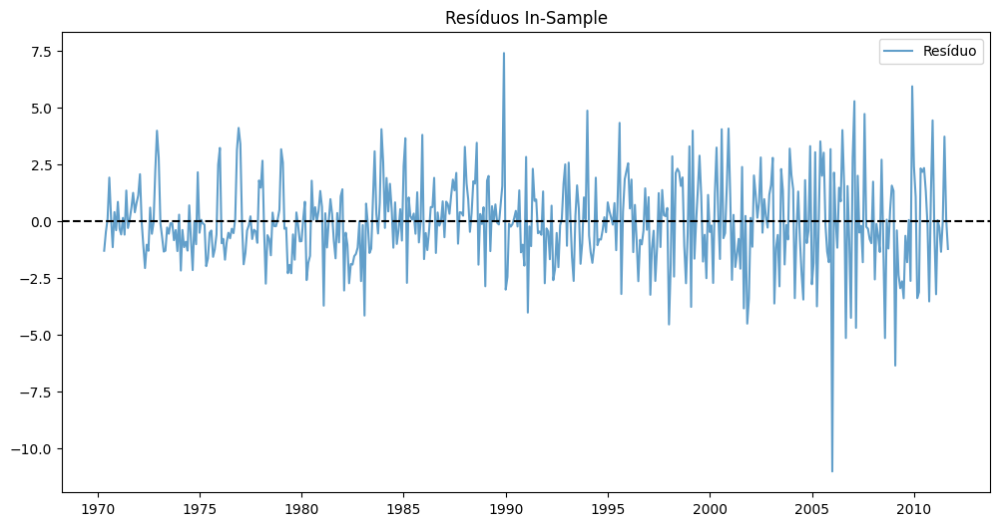

Média: -0.0577, Desvio-padrão: 1.9270

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=4.4156, p-valor=0.9267 → Sem autocorrelação
Lag 20: estatística=18.0616, p-valor=0.5834 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

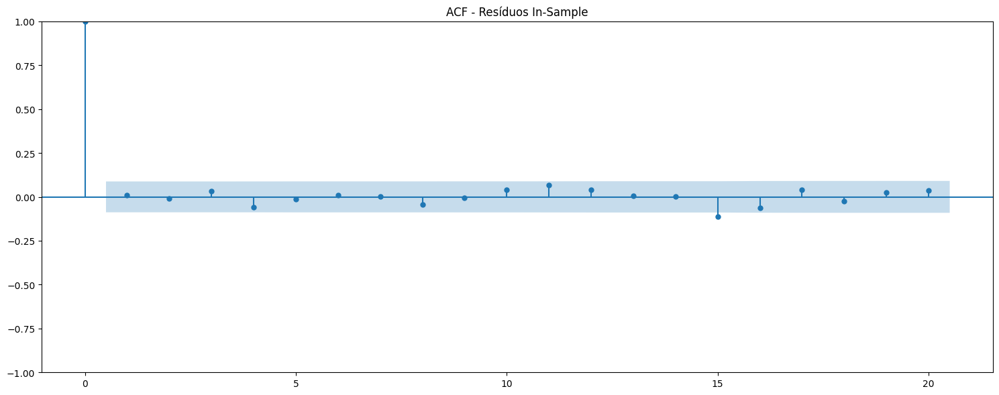


Etapa 4 - Previsões Out-of-Sample


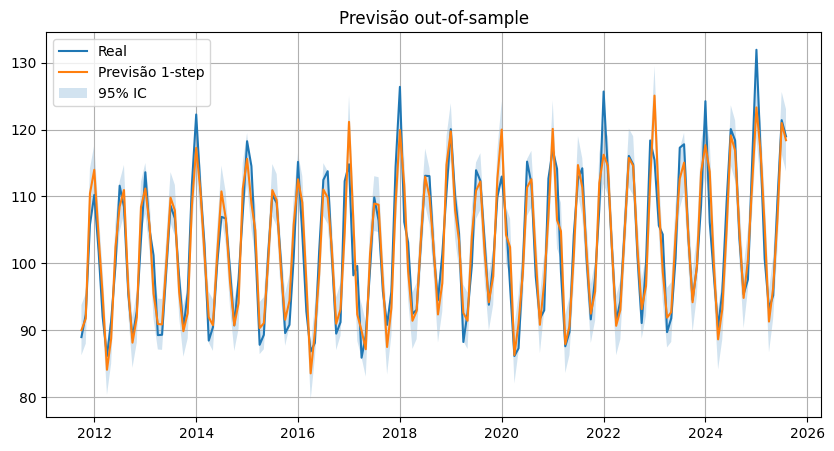


Etapa 5 - Avaliação de Métricas
Avaliação Out-of-Sample
MAE: 2.6599
MAPE: 0.0255
MSE: 11.5003

Etapa 6 - Análise de Resíduos Out-of-Sample


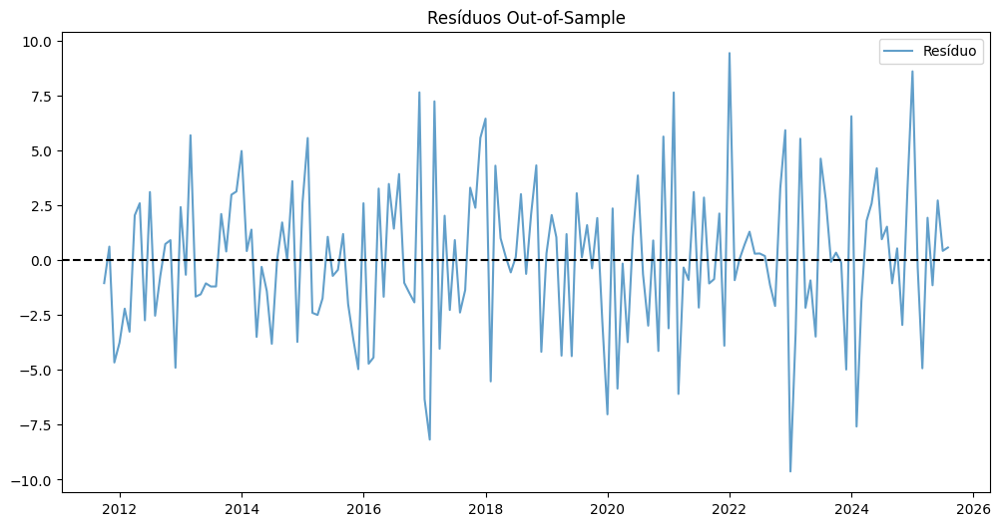

Média: 0.0476, Desvio-padrão: 3.4011

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=12.4101, p-valor=0.2585 → Sem autocorrelação
Lag 20: estatística=16.4494, p-valor=0.6884 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

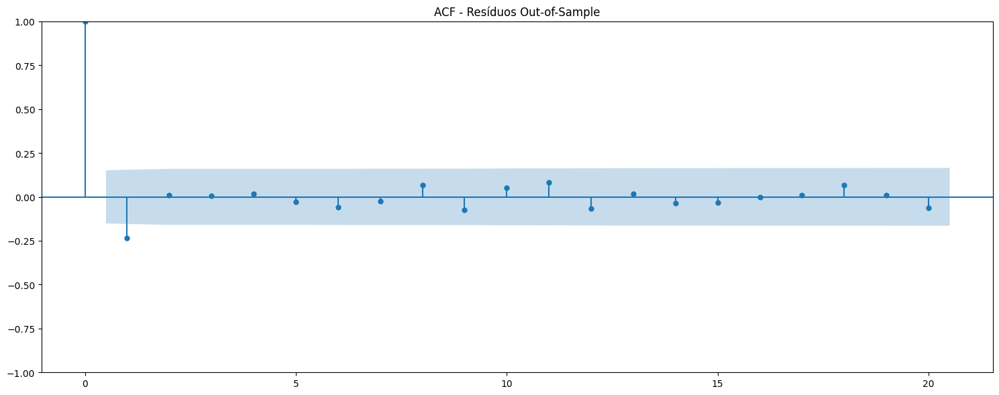


Pipeline finalizado!
Tempo total de execução: 6.13 minutos


In [36]:
resultado_sarima_3_1_1 = rodar_modelo_arima(y_train, y_test, order=(3,1,1), seasonal_order=(2, 0, 2, 6), nome_modelo="SARIMA(3,1,1)(2,0,2)[6]")


# **6. Remover componentes de Tendência e de Sazonalidade**

O objetivo aqui seria tornar a série **estacionária**, de modo que seja possível utilizar modelos clássicos como **AR**, **MA** e  **ARMA**.
- Os modelos  **AR**, **MA** e  **ARMA** só funcionam bem se a série já for estacionária.
    - Como muitas séries do mundo real têm tendência e sazonalidade, precisamos primeiro aplicar diferenciação.
- O **ARIMA** incorpora esse passo no próprio modelo (parâmetro d).

In [37]:
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Reaproveita suas funções
from backend.arima_model import treinar_modelo_arima, plot_forecast_com_intervalo
from backend.evaluation import calcular_metricas_erro, print_metricas_erro
from backend.residuals import diagnostico_residuos, plot_acf_residuos, plot_residuos
from backend.stats_tests import teste_adf  # opcional: imprime resumo ADF


# =========================
#    TRANSFORMERS
# =========================
class BaseTransformer:
    def fit(self, y: pd.Series):
        self.is_fitted_ = True
        self.freq_ = getattr(y.index, "freq", None) or pd.infer_freq(y.index)
        return self
    def transform(self, y: pd.Series) -> pd.Series: ...
    def inverse_one_step(self, y_hist: pd.Series, yhat_stat: float) -> float: ...
    def name(self) -> str: return self.__class__.__name__


class MovingAverageTrend(BaseTransformer):
    """Estacionária = y - média móvel (trailing)."""
    def __init__(self, window: int = 6, center: bool = False):
        self.window = window
        self.center = center  # use False para evitar vazamento

    def fit(self, y): 
        super().fit(y)
        return self

    def transform(self, y):
        trend = y.rolling(self.window, center=self.center).mean()
        return (y - trend).dropna()

    def _trend_from_hist(self, y_hist: pd.Series) -> float:
        if len(y_hist) < self.window:
            raise ValueError("Histórico insuficiente para a janela da MM.")
        return float(y_hist.tail(self.window).mean())

    def inverse_one_step(self, y_hist, yhat_stat):
        trend_t = self._trend_from_hist(y_hist)
        return trend_t + float(yhat_stat)

    def name(self): return f"MM(window={self.window})"


class EWMTrend(BaseTransformer):
    """Estacionária = y - média exponencialmente ponderada (trailing)."""
    def __init__(self, alpha: float = 0.3, adjust: bool = False):
        self.alpha = alpha
        self.adjust = adjust

    def fit(self, y): 
        super().fit(y)
        return self

    def transform(self, y):
        trend = y.ewm(alpha=self.alpha, adjust=self.adjust).mean()
        return (y - trend).dropna()

    def _trend_from_hist(self, y_hist: pd.Series) -> float:
        return float(y_hist.ewm(alpha=self.alpha, adjust=self.adjust).mean().iloc[-1])

    def inverse_one_step(self, y_hist, yhat_stat):
        trend_t = self._trend_from_hist(y_hist)
        return trend_t + float(yhat_stat)

    def name(self): return f"EWM(alpha={self.alpha})"


class Differencer(BaseTransformer):
    """
    Diferença regular (d) e/ou sazonal (D,m). A inversão 1-step usa âncoras do histórico.
    """
    def __init__(self, d: int = 1, D: int = 0, m: int = 0):
        self.d, self.D, self.m = d, D, m

    def fit(self, y):
        super().fit(y)
        return self

    def transform(self, y):
        z = y.copy()
        for _ in range(self.D):
            z = z.diff(self.m)
        for _ in range(self.d):
            z = z.diff()
        return z.dropna()

    def inverse_one_step(self, y_hist: pd.Series, yhat_stat: float) -> float:
        val = float(yhat_stat)
        # inverte diferenças regulares
        last = y_hist.iloc[-1]
        for _ in range(self.d):
            val = last + val
            last = val
        # inverte diferenças sazonais
        for _ in range(self.D):
            if len(y_hist) < self.m:
                raise ValueError("Histórico insuficiente para inverter diferença sazonal.")
            val = y_hist.iloc[-self.m] + val
        return float(val)

    def name(self):
        parts = []
        if self.d: parts.append(f"d={self.d}")
        if self.D and self.m: parts.append(f"D={self.D},m={self.m}")
        return "Diff(" + (",".join(parts) if parts else "none") + ")"


# =========================
#    HELPERS
# =========================
def _transform_sem_vazamento(transformer, y_train: pd.Series, y_test: pd.Series) -> tuple[pd.Series, pd.Series]:
    """
    Gera série estacionária de treino e teste SEM olhar o futuro do teste.
    """
    transformer.fit(y_train)
    y_stat_train = transformer.transform(y_train)

    buf = pd.concat([y_train, y_test])
    y_stat_full = transformer.transform(buf)
    y_stat_test = y_stat_full.loc[y_test.index]

    return y_stat_train, y_stat_test


def _needed_hist_len(transformer: BaseTransformer) -> int:
    """
    Número mínimo de observações no histórico para reconstrução 1-step.
    """
    need = 1
    if isinstance(transformer, MovingAverageTrend):
        need = max(need, transformer.window)
    if isinstance(transformer, Differencer) and transformer.D and transformer.m:
        need = max(need, transformer.m)
    return need


def _init_hist_for_first_t(y_train: pd.Series, first_t, transformer: BaseTransformer) -> pd.Series:
    """
    Histórico inicial até t-1 com tamanho suficiente para a reconstrução 1-step.
    """
    need = _needed_hist_len(transformer)
    # tudo até t-1
    hist_candidate = y_train.loc[:first_t].iloc[:-1].copy()
    if len(hist_candidate) >= need:
        return hist_candidate.tail(need)
    # fallback: pegue os primeiros 'need' pontos do treino (transform.dropna() já garante que existe)
    return y_train.iloc[:need].copy()


def _plot_in_sample_original(y_train: pd.Series, yhat_in: pd.Series, titulo="Previsão in-sample"):
    idx = y_train.index.intersection(yhat_in.index)
    plt.figure(figsize=(10, 5))
    plt.plot(idx, yhat_in.loc[idx], label="Previsto")
    plt.plot(idx, y_train.loc[idx], label="Real")
    plt.title(titulo)
    plt.legend(); plt.grid(True); plt.show()


# =========================
#    PIPELINE
# =========================
def rodar_modelo_arima_transformado(
    y: pd.Series,
    transformer: BaseTransformer,
    order=(1, 0, 0),
    seasonal_order=(0, 0, 0, 0),
    pct_treino: float = 0.8,
    usar_observado_para_hist: bool = True,
    nome_modelo: str | None = None
):
    """
    Etapas (prints compatíveis com seu pipeline original):

    1) Estacionarização (fit/transform) sem vazamento + ADF opcional
    2) Treinamento do ARIMA na série estacionária
    3) Previsões In-Sample (rolling, 1-step) na escala ORIGINAL + diagnósticos
    4) Previsões Out-of-Sample (rolling, 1-step) na escala ORIGINAL + IC
    5) Avaliação de Métricas (escala original)
    6) Diagnóstico de Resíduos Out-of-Sample
    """
    inicio = time.time()
    nome = nome_modelo or f"ARIMA sobre {transformer.name()}"

    # Split na série original
    n_train = int(len(y) * pct_treino)
    y_train = y.iloc[:n_train].astype(float)
    y_test  = y.iloc[n_train:].astype(float)

    print("="*80)
    print(f"Rodando {nome} com order={order} seasonal_order={seasonal_order}")
    print(f"Transformer: {transformer.name()} | Treino: {len(y_train)} | Teste: {len(y_test)}")
    print("="*80)

    # ---------------- Etapa 1 ----------------
    print("\nEtapa 1 - Estacionarização (fit/transform)")
    y_stat_train, y_stat_test = _transform_sem_vazamento(transformer, y_train, y_test)
    print(f"Série estacionária gerada: treino={len(y_stat_train)}, teste={len(y_stat_test)}")

    print("\nTeste ADF na série estacionária (treino):")
    teste_adf(y_stat_train)  # opcional (imprime resultado)

    # ---------------- Etapa 2 ----------------
    print("\nEtapa 2 - Treinamento do Modelo (ARIMA na estacionária)")
    modelo = treinar_modelo_arima(y_stat_train, order=order, seasonal_order=seasonal_order)

    # ---------------- Etapa 3 ----------------
    print("\nEtapa 3 - Previsões In-Sample (escala original) e diagnóstico")
    yhat_in_vals = []
    # histórico inicial apenas até t0-1 (sem vazamento) e com tamanho mínimo adequado
    t0 = y_stat_train.index[0]
    hist = _init_hist_for_first_t(y_train, t0, transformer)

    for t in y_stat_train.index:
        # previsão 1-step na estacionária
        rhat_t = modelo.predict(n_periods=1)[0]
        # reconstrução na escala original usando APENAS o histórico até t-1
        yhat_t = transformer.inverse_one_step(hist, rhat_t)
        yhat_in_vals.append(yhat_t)

        # atualiza o ARIMA com o valor observado NA ESTACIONÁRIA
        modelo.update(y_stat_train.loc[t])

        # alimenta o histórico (por padrão, com o OBSERVADO do original)
        hist.loc[t] = y_train.loc[t] if usar_observado_para_hist else yhat_t

    yhat_in = pd.Series(yhat_in_vals, index=y_stat_train.index)

    _plot_in_sample_original(y_train, yhat_in, "Previsão in-sample")

    # resíduos in-sample (escala original)
    resid_in = (y_train.loc[yhat_in.index] - yhat_in)
    plot_residuos(resid_in, "Resíduos In-Sample")
    diagnostico_residuos(resid_in)
    plot_acf_residuos(resid_in, "Resíduos In-Sample")

    # ---------------- Etapa 4 ----------------
    print("\nEtapa 4 - Previsões Out-of-Sample (1-step, escala original)")
    yhat_out_vals, confs = [], []
    for t in y_stat_test.index:
        fc, ci = modelo.predict(n_periods=1, return_conf_int=True, alpha=0.05)
        rhat_t = fc[0]
        rlo_t, rhi_t = ci[0]

        yhat_t = transformer.inverse_one_step(hist, rhat_t)
        lo_t   = transformer.inverse_one_step(hist, rlo_t)
        hi_t   = transformer.inverse_one_step(hist, rhi_t)

        yhat_out_vals.append(yhat_t)
        confs.append((lo_t, hi_t))

        # update com OBSERVADO na estacionária
        modelo.update(y_stat_test.loc[t])

        # histórico: por padrão usa observado do original (1-step honesto)
        hist.loc[t] = y_test.loc[t] if usar_observado_para_hist else yhat_t

    yhat_out = pd.Series(yhat_out_vals, index=y_stat_test.index)
    confs = np.asarray(confs)

    # mesmo padrão de plot do seu pipeline original
    plot_forecast_com_intervalo(yhat_out.values, confs, y_test)

    # ---------------- Etapa 5 ----------------
    print("\nEtapa 5 - Avaliação de Métricas (escala original)")
    metricas = calcular_metricas_erro(y_test, yhat_out)
    print_metricas_erro(metricas)

    # ---------------- Etapa 6 ----------------
    print("\nEtapa 6 - Análise de Resíduos Out-of-Sample")
    resid_out = (y_test - yhat_out)
    plot_residuos(resid_out, "Resíduos Out-of-Sample")
    diagnostico_residuos(resid_out)
    plot_acf_residuos(resid_out, "Resíduos Out-of-Sample")

    fim = time.time()
    duracao_segundos = fim - inicio
    duracao_minutos = duracao_segundos / 60

    print("\nPipeline finalizado!")
    print(f"Tempo total de execução: {duracao_minutos:.2f} minutos")
    print("="*80)

    return {
        "modelo_estacionario": modelo,
        "transformer": transformer.name(),
        "metricas": metricas,
        "residuos_in": resid_in,
        "residuos_out": resid_out,
        "yhat_in": yhat_in,
        "yhat_out": yhat_out,
        "confs_out": confs,
        "tempo_execucao_minutos": duracao_minutos
    }


## **3.1. Suavização por Média Móvel**

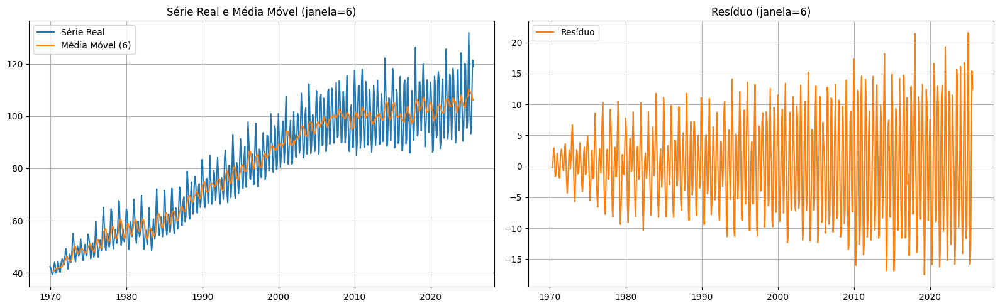

In [38]:
window = 6

mm, res_mm = calc_residuo_mm(df_1970_to_2025[coluna_numerica], window=window, center=False)
plot_mm_e_residuo(df_1970_to_2025[coluna_numerica], mm, res_mm, window=window)

In [39]:
resultado = teste_adf(res_mm)


Série é estacionária (p-valor=0.0000)
ADF Statistic: -7.87616849482477
Critical Values:
	1%: -3.441
	5%: -2.866
	10%: -2.569


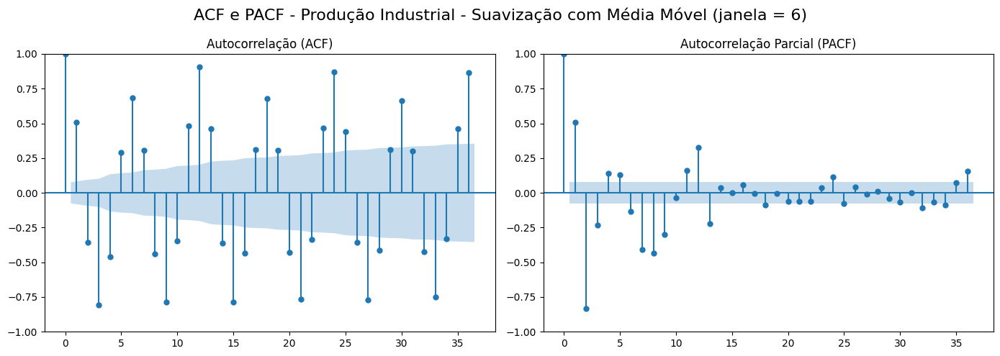

In [40]:
plot_acf_pacf(res_mm, lags=36, title=f"ACF e PACF - Produção Industrial - Suavização com Média Móvel (janela = {window})")

Após aplicar a suavização, devemos verificar duas coisas:
1. **Se o resíduo é estacionário**: necessário para aplicar modelos como **AR**, **MA**, **ARMA**, **ARIMA**, **SARIMA**.
2. **Se o resíduo é um ruído I.I.D.** (independente e identicamente distribuído): nesse caso, **não há mais estrutura a modelar**.

Se a série **não é estacionária**, pode-se aplicar outra suavização ou usar modelos que **não exigem estacionariedade**.

No exemplo acima, os resíduos das janelas 3 e 12:
- são **estacionários** (p-valores < 0.05);
- **não são ruído I.I.D.** (há lags com autocorrelação significativa).

<span style="color:#FFD700;">**Conclusão**</span>: os resíduos ainda contêm padrão
- Podem ser modelados com ARIMA, por exemplo.

Rodando ARIMA sobre MM com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)
Transformer: MM(window=6) | Treino: 501 | Teste: 167

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=496, teste=167

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0000)
ADF Statistic: -6.645501891210798
Critical Values:
	1%: -3.444
	5%: -2.868
	10%: -2.570

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


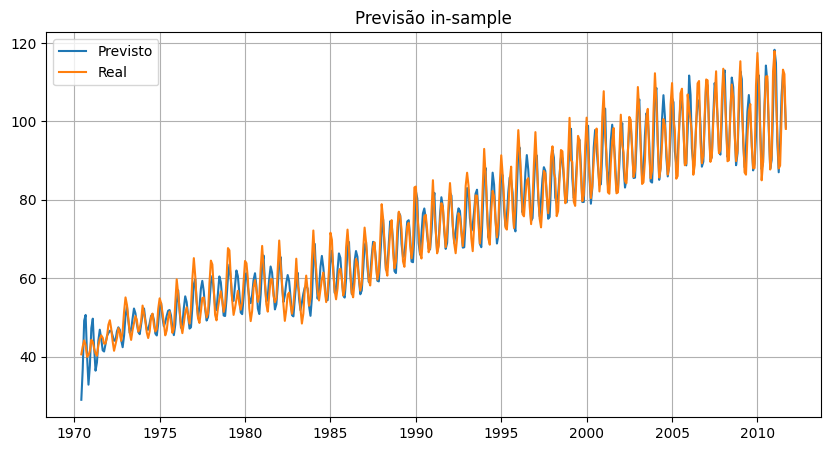

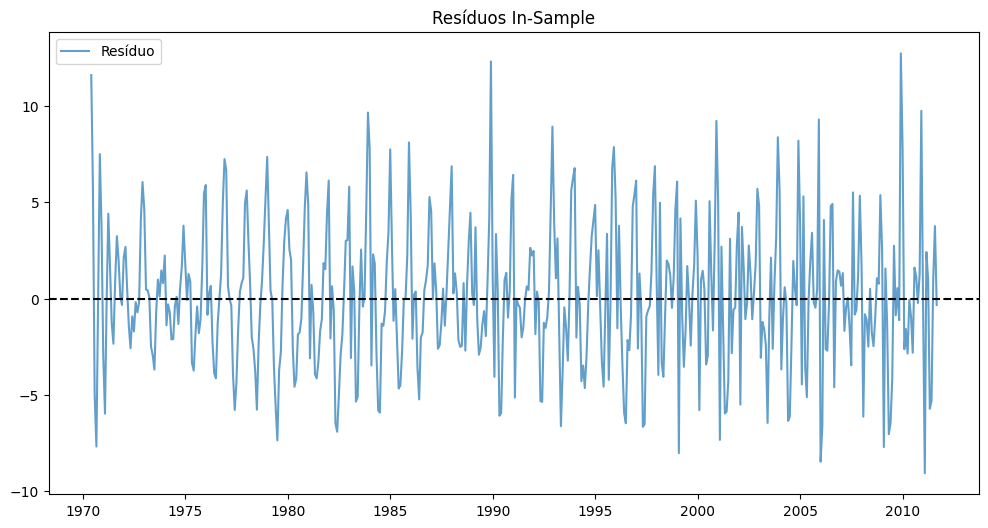

Média: 0.1196, Desvio-padrão: 3.6442

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=403.8995, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=940.4154, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

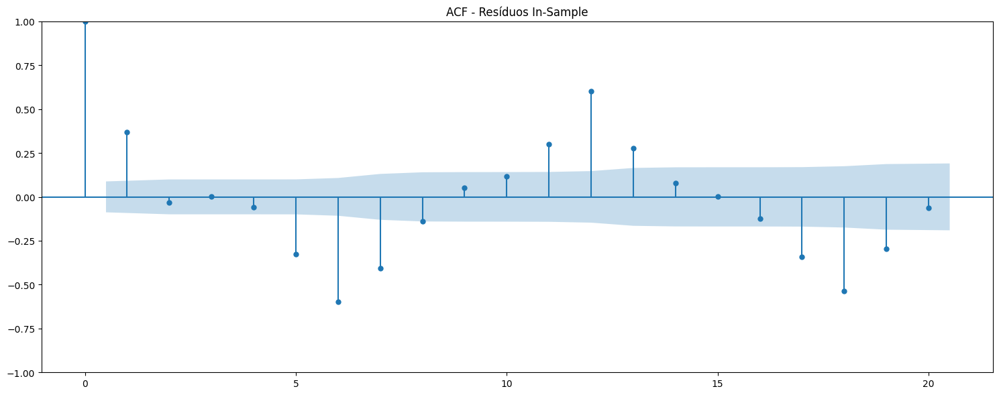


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


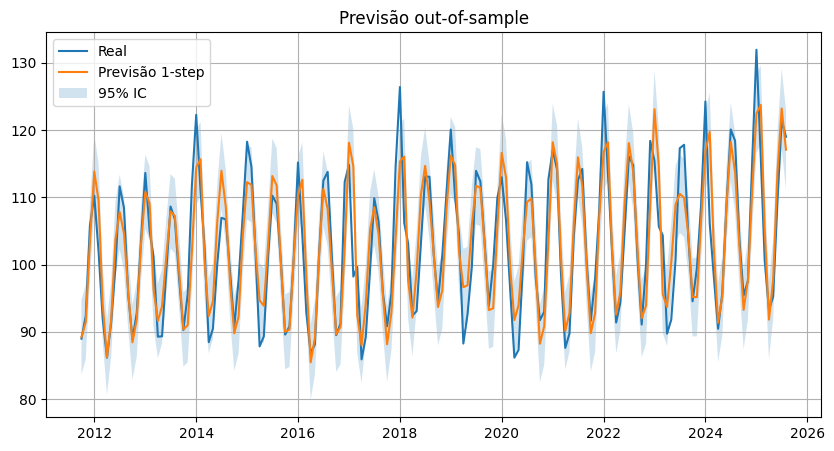


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 3.6431
MAPE: 0.0349
MSE: 22.4422

Etapa 6 - Análise de Resíduos Out-of-Sample


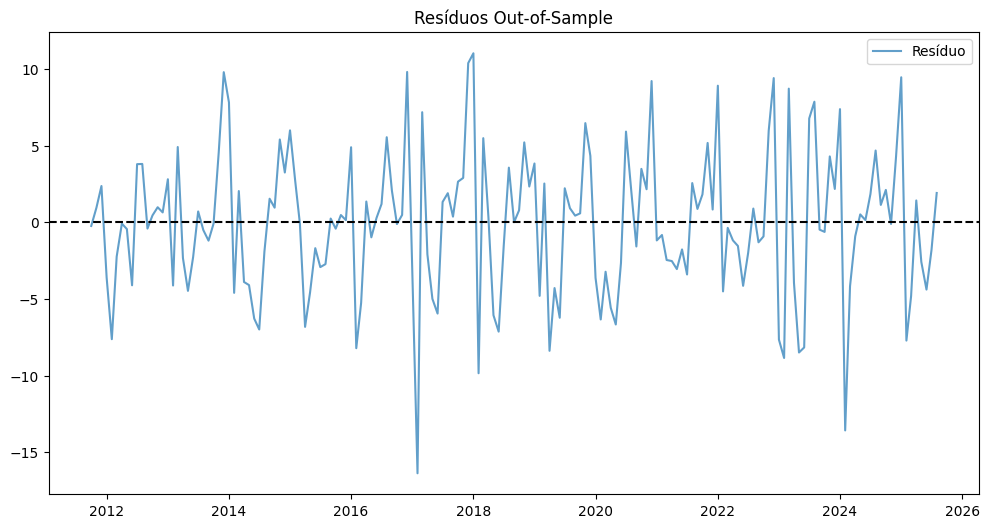

Média: -0.1269, Desvio-padrão: 4.7499

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=68.0668, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=127.1453, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

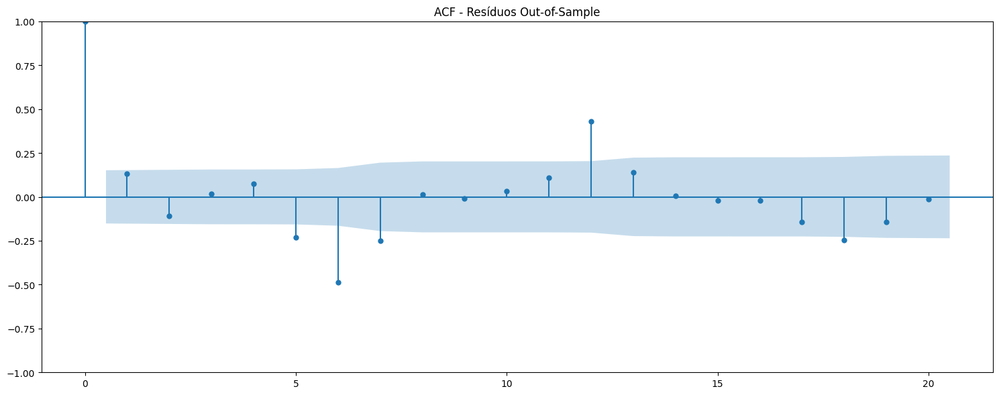


Pipeline finalizado!
Tempo total de execução: 2.69 minutos


In [41]:
res_mm = rodar_modelo_arima_transformado(
    y=df_1970_to_2025[coluna_numerica],
    transformer=MovingAverageTrend(window=6),
    order=(2,0,2), seasonal_order=(0,0,0,0),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre MM"
)

## **3.2. Suavização Exponencial**

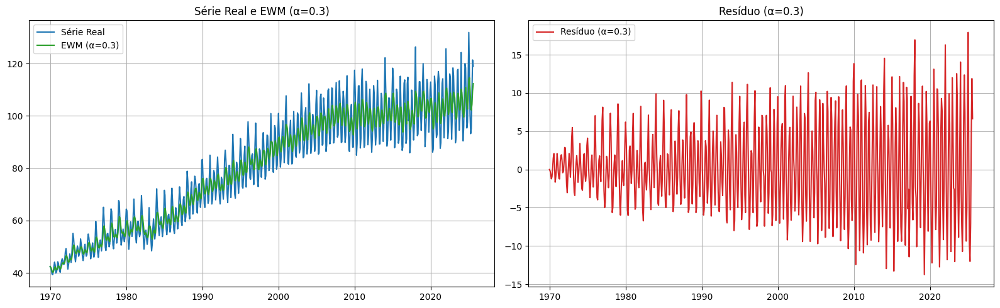

In [42]:
alpha = 0.3
ewm, res_ewm = calc_residuo_ewm(df_1970_to_2025[coluna_numerica], alpha=alpha)
plot_ewm_e_residuo(df_1970_to_2025[coluna_numerica], ewm, res_ewm, alpha=alpha)

In [43]:
resultado = teste_adf(res_ewm)

Série é estacionária (p-valor=0.0000)
ADF Statistic: -7.996317520039331
Critical Values:
	1%: -3.440
	5%: -2.866
	10%: -2.569


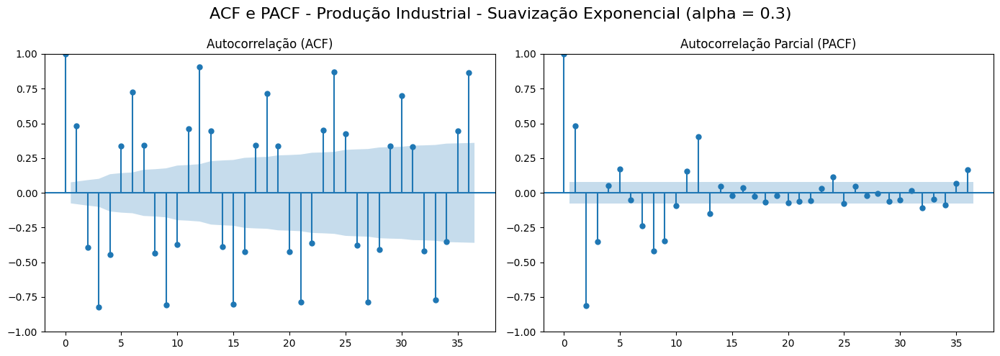

In [44]:
plot_acf_pacf(res_ewm, lags=36, title=f"ACF e PACF - Produção Industrial - Suavização Exponencial (alpha = {alpha})")

Rodando ARIMA sobre EWM com order=(2, 0, 2) seasonal_order=(0, 0, 0, 0)
Transformer: EWM(alpha=0.3) | Treino: 501 | Teste: 167

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=501, teste=167

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0000)
ADF Statistic: -6.979934665337428
Critical Values:
	1%: -3.444
	5%: -2.868
	10%: -2.570

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


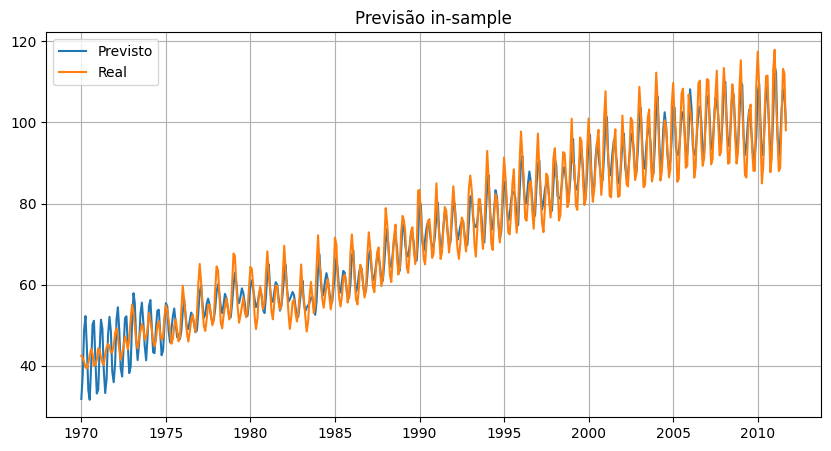

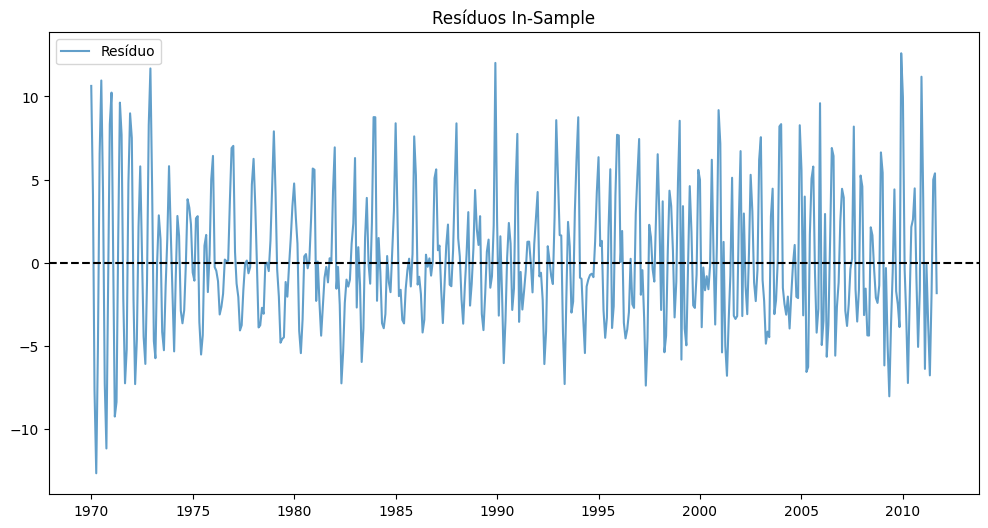

Média: 0.1215, Desvio-padrão: 4.1355

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=320.1491, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=810.0258, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

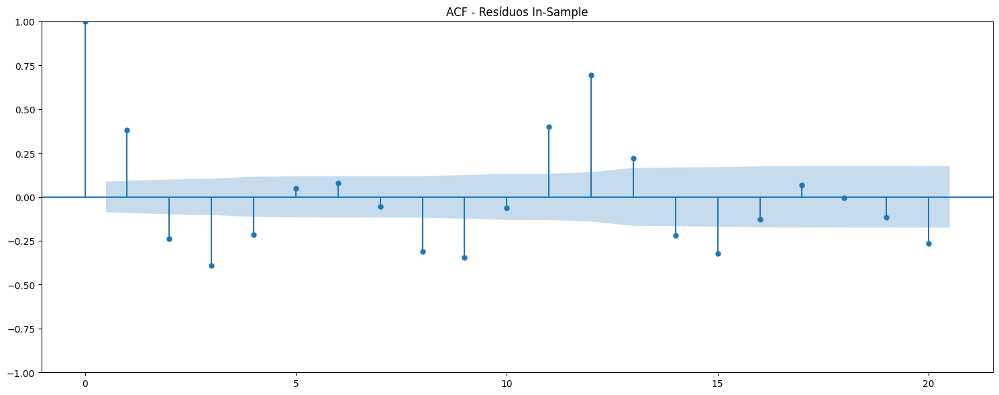


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


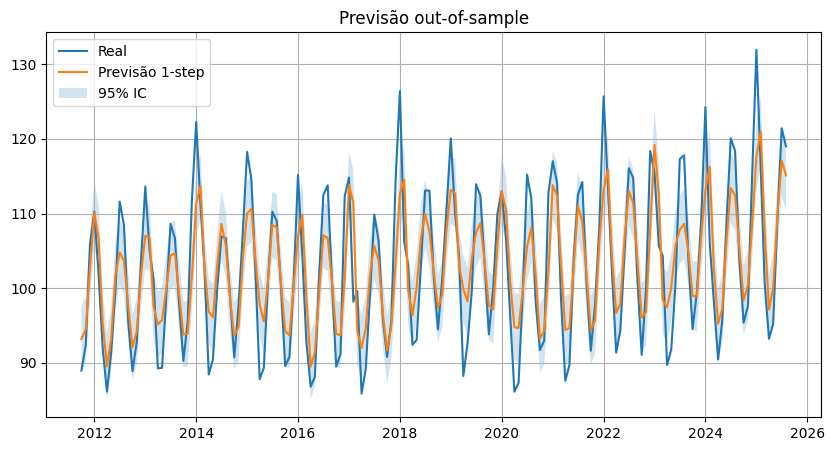


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 4.2959
MAPE: 0.0416
MSE: 28.0777

Etapa 6 - Análise de Resíduos Out-of-Sample


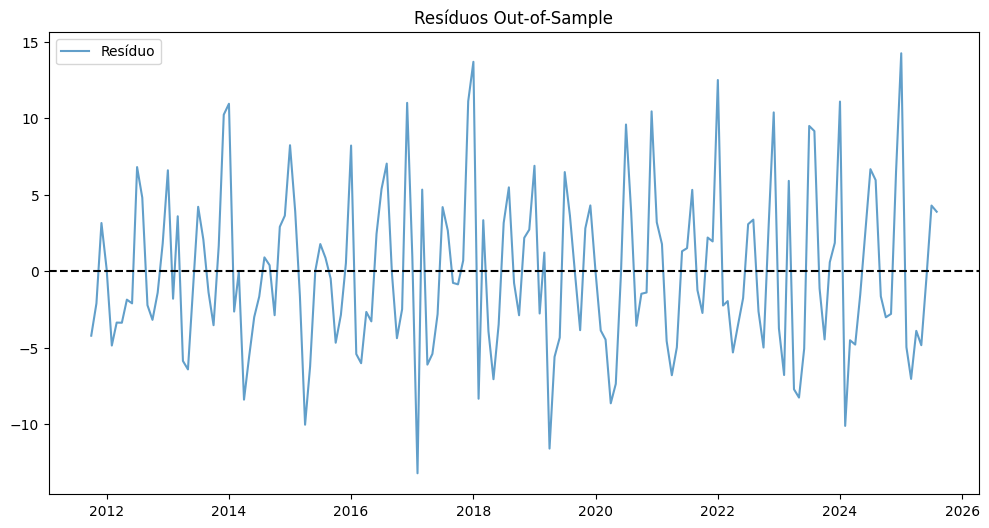

Média: -0.1038, Desvio-padrão: 5.3138

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=68.1043, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=187.9120, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

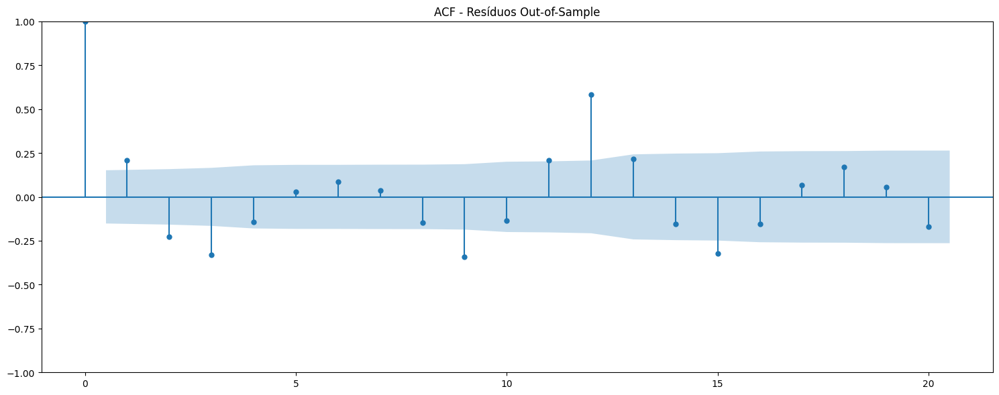


Pipeline finalizado!
Tempo total de execução: 2.57 minutos


In [45]:
res_ewm = rodar_modelo_arima_transformado(
    y=df_1970_to_2025[coluna_numerica],
    transformer=EWMTrend(alpha=0.3),
    order=(2,0,2), seasonal_order=(0,0,0,0),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre EWM"
)

### **3.1.4. Eliminação de Tendência por Diferenciação**

In [46]:
df

,IPG2211A2N
observation_date,
1939-01-01,3.3336
1939-02-01,3.3591
1939-03-01,3.4354
1939-04-01,3.4608
1939-05-01,3.4608
...,...
2025-04-01,93.2440
2025-05-01,95.2150
2025-06-01,109.4591


In [47]:
df.diff(1)

,IPG2211A2N
observation_date,
1939-01-01,NaN
1939-02-01,0.0255
1939-03-01,0.0763
1939-04-01,0.0254
1939-05-01,0.0000
...,...
2025-04-01,-7.4291
2025-05-01,1.9710
2025-06-01,14.2441


Rodando ARIMA sobre Diff(1) com order=(3, 0, 1) seasonal_order=(2, 0, 2, 6)
Transformer: Diff(d=1) | Treino: 501 | Teste: 167

Etapa 1 - Estacionarização (fit/transform)
Série estacionária gerada: treino=500, teste=167

Teste ADF na série estacionária (treino):
Série é estacionária (p-valor=0.0000)
ADF Statistic: -7.649949417357846
Critical Values:
	1%: -3.444
	5%: -2.868
	10%: -2.570

Etapa 2 - Treinamento do Modelo (ARIMA na estacionária)

Etapa 3 - Previsões In-Sample (escala original) e diagnóstico


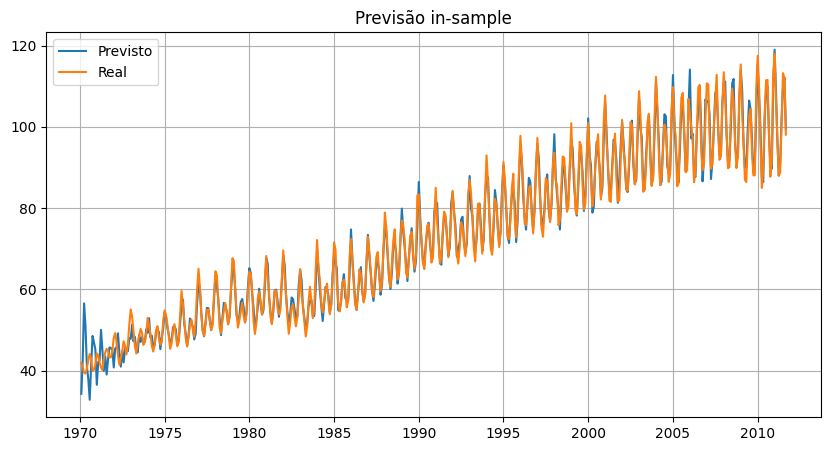

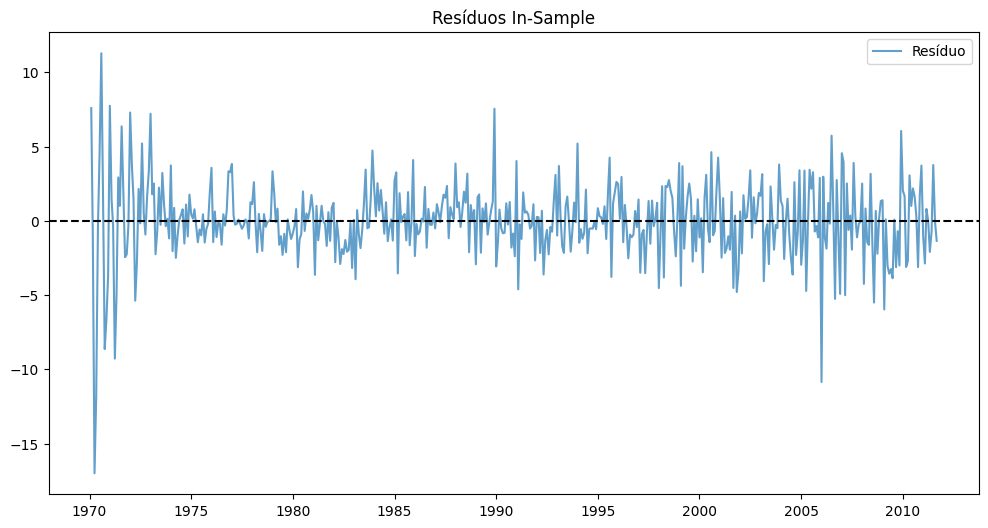

Média: -0.0104, Desvio-padrão: 2.5547

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=91.0046, p-valor=0.0000 → Autocorrelação detectada
Lag 20: estatística=156.7260, p-valor=0.0000 → Autocorrelação detectada


<Figure size 1000x400 with 0 Axes>

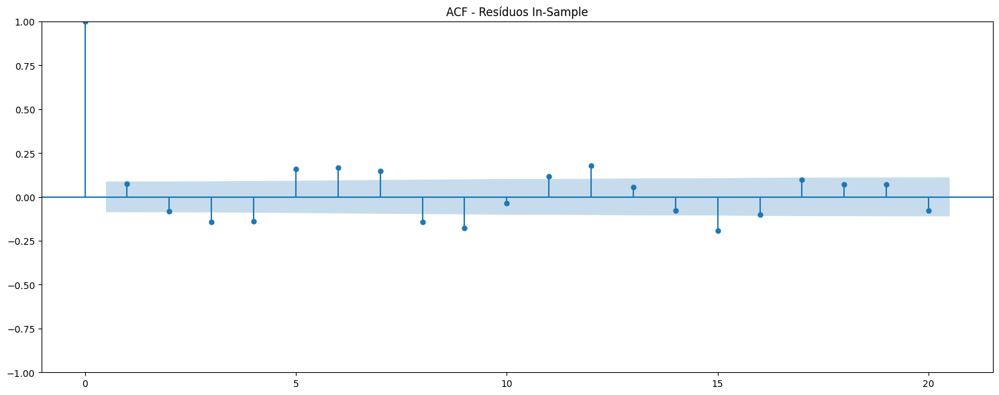


Etapa 4 - Previsões Out-of-Sample (1-step, escala original)


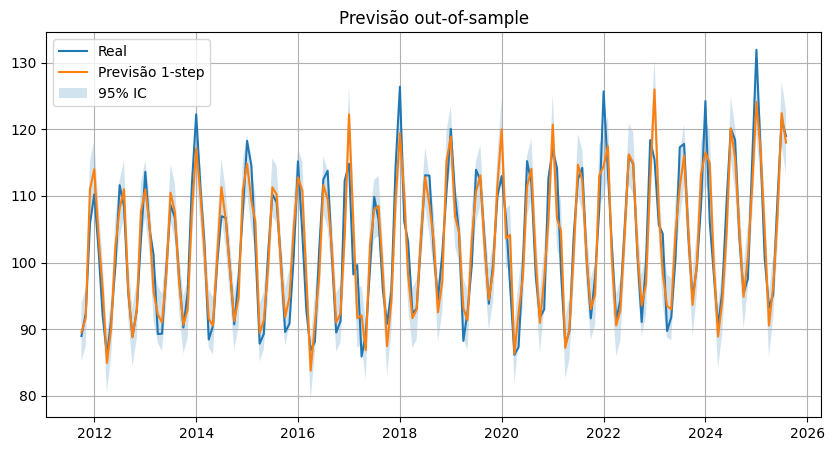


Etapa 5 - Avaliação de Métricas (escala original)
Avaliação Out-of-Sample
MAE: 2.8390
MAPE: 0.0272
MSE: 13.2624

Etapa 6 - Análise de Resíduos Out-of-Sample


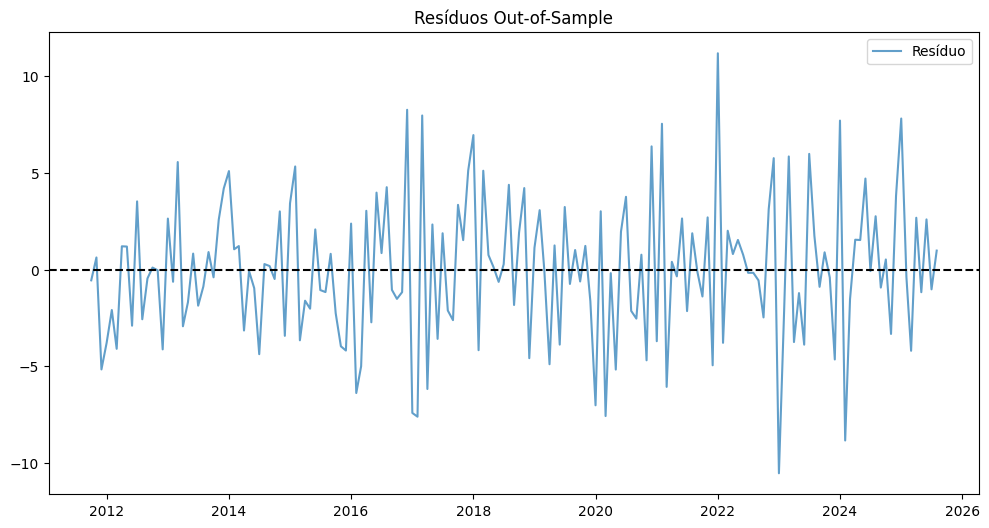

Média: -0.0429, Desvio-padrão: 3.6525

Teste Ljung-Box (autocorrelação):
Lag 10: estatística=21.4164, p-valor=0.0184 → Autocorrelação detectada
Lag 20: estatística=28.8326, p-valor=0.0911 → Sem autocorrelação


<Figure size 1000x400 with 0 Axes>

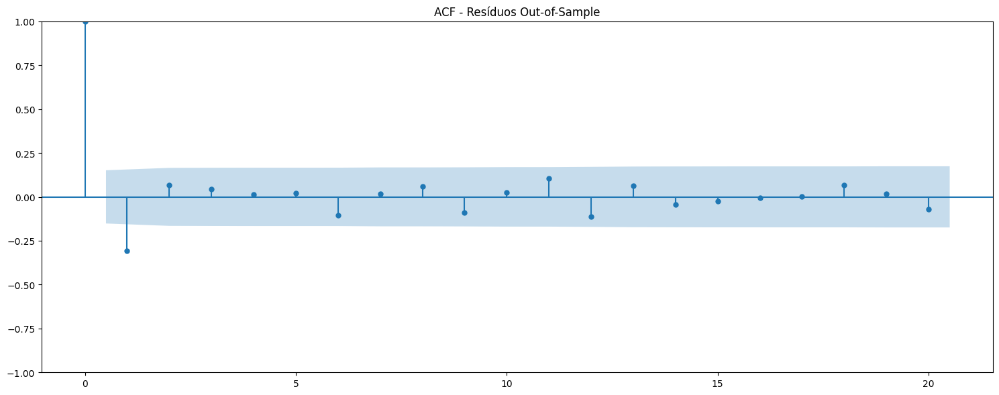


Pipeline finalizado!
Tempo total de execução: 23.11 minutos


In [48]:
# 3) Diferença “por fora do ARIMA”
res_diff = rodar_modelo_arima_transformado(
    y=df_1970_to_2025[coluna_numerica],
    transformer=Differencer(d=1, D=0, m=0),
    order=(3,0,1), seasonal_order=(2,0,2,6),
    pct_treino=0.75, usar_observado_para_hist=True,
    nome_modelo="ARIMA sobre Diff(1)"
)